# **Pair Trading, Statistical Arbitrage, and Mean-Reverting Portfolio**
QF Department student 111071701    
Lin, Yu Chun

## **I. Pair Trading**
As we are familiar with, we typically assume that individual stocks follow a specific random process, implying that stock price movements involve uncertainty and are difficult to predict. The key to pair trading lies in simultaneously trading two stocks that exhibit high correlation and high cointegration, aiming to identify differences in their prices and capitalize on these price differentials to generate profits. The first step to develop pair trading strategies is to find the cointegrated pair. Assume there are two nonstationary (log-) price time series, $y_{1,t}$ and $y_{2,t}$, it searches for parameters $α$, $β$, and $ρ$ such that


\begin{align*}
y_{1,t} &=α+β\cdot y_{2,t}+ res_{t}, \\
\text{res}_{t} &=ρ\cdot res_{t−1} + ϵ_{t}, \\
\end{align*}

where $res_{t}$ is the residual and $ϵ_{t}$ is the innovation. If |$ρ$| < 1
, then we say $y_{1,t}$ and $y_{2,t}$ are cointegrated. Regarding the details and applications of the Engle-Granger test, please refer to the following links:

https://www.aptech.com/blog/a-guide-to-conducting-cointegration-tests/

https://medium.com/@ritusantra/tests-for-stationarity-in-time-series-dickey-fuller-test-augmented-dickey-fuller-adf-test-d2e92e214360

When the p-value of the series is smaller than the certain p-value threshold, relative to the confidence level, we reject $H_{0}$ and say that the series is stationary.

After doing the above test, we refer to the price differential as the spread $z_{t}$, defined as follows:

 $$ z_{t}  = y_{1t} - β \cdot y_{2t} = μ + ϵ_{t} $$

where $β$ and $μ$ are secret ingredients and $ϵ_{t}$ is white noise. $z_{t}$ is stationary and mean reverting. And $z_{t}$ is really what we want to trade.

In [ ]:
pip install arch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.0/983.0 kB 6.5 MB/s eta 0:00:00


In [ ]:
pip install pykalman

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.9/228.9 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pykalman: filename=pykalman-0.9.5-py3-none-any.whl size=48442 sha256=c2ee9f9bcf85f0aa540727095929cce51f8ae21b61187332267f7fb7696cb7c7
  Stored in directory: /root/.cache/pip/wheels/76/33/ef/5f332226e13a5089c6dd4b01cc2bcb59491d18f955fa2d3807
Successfully built pykalman


**U.S. Stock Pair Trading**

Considering that current securities spot trading may revolve primarily around stocks, I have chosen to adopt the following approach and construct pair trading strategies based on stocks.
I attempt to utilize the top fifty market value stocks in the United States, selecting suitable pairs, and formulating trading strategies.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
from itertools import combinations
from statsmodels.tsa.stattools import coint
import seaborn as sns
import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS
from arch.unitroot.cointegration import engle_granger
from pykalman import KalmanFilter
from scipy.signal import lfilter

At first, I establish a target portfolio using the stocks with the top fifty market values in the United States, which may be more frequently traded targets in the Taiwan securities industry. I obtain historical stock prices, with the sample period from 2021/01/01 to 2023/12/25, from Yahoo Finance, and the dataframe is displayed as follows:

In [ ]:
start_date = '2021-01-01'
end_date = '2023-12-25'

tickers = ['AAPL','MSFT','AMZN','NVDA','META','GOOGL','GOOG','TSLA','LLY','V','TSM','UNH','AVGO','BRK-B','NVO','JPM','WMT','XOM','MA','JNJ','PG','ORCL','BRK-A','HD','ADBE','CVX','ASML','COST','MRK','KO','TM','ABBV','BAC','PEP','FMX','CRM','SHEL','NFLX','ACN','MCD','NVS','LIN','AMD','AZN','BABA','CSCO','TMO','INTC','PDD','SAP']
stock_data_close = pd.DataFrame(yf.download(tickers, start_date, end_date)['Close'])
print(stock_data_close.head(10))

[*********************100%%**********************]  50 of 50 completed


                  AAPL        ABBV         ACN        ADBE        AMD  \
Date                                                                    
2021-01-04  129.410004  105.410004  256.459991  485.339996  92.300003   
2021-01-05  131.009995  106.500000  257.920013  485.690002  92.769997   
2021-01-06  126.599998  105.580002  260.739990  466.309998  90.330002   
2021-01-07  130.919998  106.709999  263.200012  477.739990  95.160004   
2021-01-08  132.050003  107.269997  264.160004  485.100006  94.580002   
2021-01-11  128.979996  109.019997  260.350006  474.239990  97.250000   
2021-01-12  128.800003  109.779999  258.399994  471.649994  95.360001   
2021-01-13  130.889999  112.449997  257.079987  472.049988  91.779999   
2021-01-14  128.910004  111.629997  255.000000  463.269989  90.790001   
2021-01-15  127.139999  110.519997  253.649994  458.079987  88.209999   

                  AMZN        ASML        AVGO        AZN        BABA  ...  \
Date                                         

Secondly, I deal with NA in the price data and the fix the length problem.

                  AAPL        ABBV         ACN        ADBE        AMD  \
2021-01-01  129.410004  105.410004  256.459991  485.339996  92.300003   
2021-01-02  129.410004  105.410004  256.459991  485.339996  92.300003   
2021-01-03  129.410004  105.410004  256.459991  485.339996  92.300003   
2021-01-04  129.410004  105.410004  256.459991  485.339996  92.300003   
2021-01-05  131.009995  106.500000  257.920013  485.690002  92.769997   
2021-01-06  126.599998  105.580002  260.739990  466.309998  90.330002   
2021-01-07  130.919998  106.709999  263.200012  477.739990  95.160004   
2021-01-08  132.050003  107.269997  264.160004  485.100006  94.580002   
2021-01-09  131.026667  107.853330  262.890004  481.480001  95.470001   
2021-01-10  130.003332  108.436663  261.620005  477.859996  96.360001   

                  AMZN        ASML        AVGO        AZN        BABA  ...  \
2021-01-01  159.331497  500.000000  425.220001  50.520000  227.850006  ...   
2021-01-02  159.331497  500.000000  425.

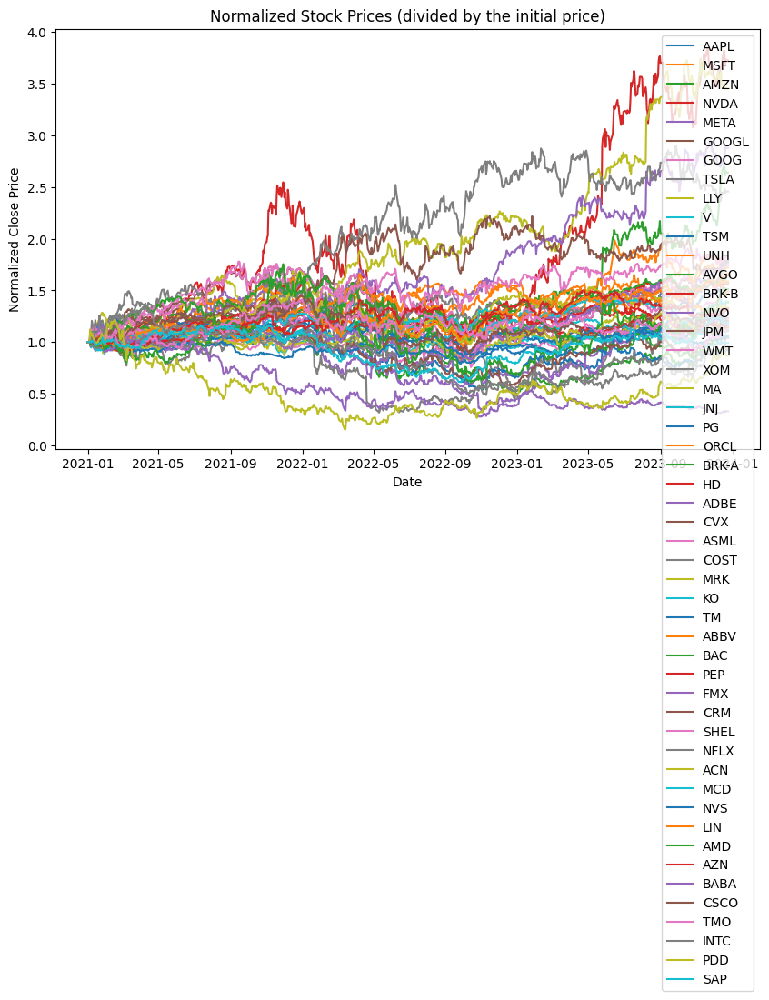

In [ ]:
def Sanitize_data(stock_data_close):
    days_length = (pd.to_datetime(end_date) - pd.to_datetime(start_date)).days
    data_sanitized = {}
    date_range = pd.date_range(start=start_date, end=end_date, freq='D')
    tickers = stock_data_close.columns
    for i in range(0,len(tickers)):
        data = stock_data_close[tickers[i]]
        if data is None or len(data) < (days_length / 2):
            continue
        if len(data) > days_length:
            data = data[-days_length:]
        data = data.reindex(date_range)
        data.replace([np.inf, -np.inf], np.nan, inplace=True)
        data.interpolate(method='linear', inplace=True)
        data.fillna(method='pad', inplace=True)
        data.fillna(method='bfill', inplace=True)
        assert not np.any(np.isnan(data)) and not np.any(np.isinf(data))
        data_sanitized[tickers[i]] = data
    data_sanitized = pd.DataFrame(data_sanitized)
    return data_sanitized

sanitized = Sanitize_data(stock_data_close)
print(sanitized.head(10))

plt.figure(figsize=(10, 6))

for ticker in tickers:
    plt.plot(sanitized.index, np.array(sanitized[ticker]/sanitized[ticker].iloc[0]), label=ticker)

plt.title('Normalized Stock Prices (divided by the initial price)')
plt.xlabel('Date')
plt.ylabel('Normalized Close Price')
plt.legend()
plt.show()

Thirdly, I try to find the cointegrated pairs by the Engle-Granger test with whose p-values in the ADF test are the three lowest and plot their price trend to see their correlation. In the heatmap, we can clearly see a map of who is paired with who. Besides, unlike all these cryptocurrencies being closely connected, the top 50 market value stocks haven't shown such a phenomenon.

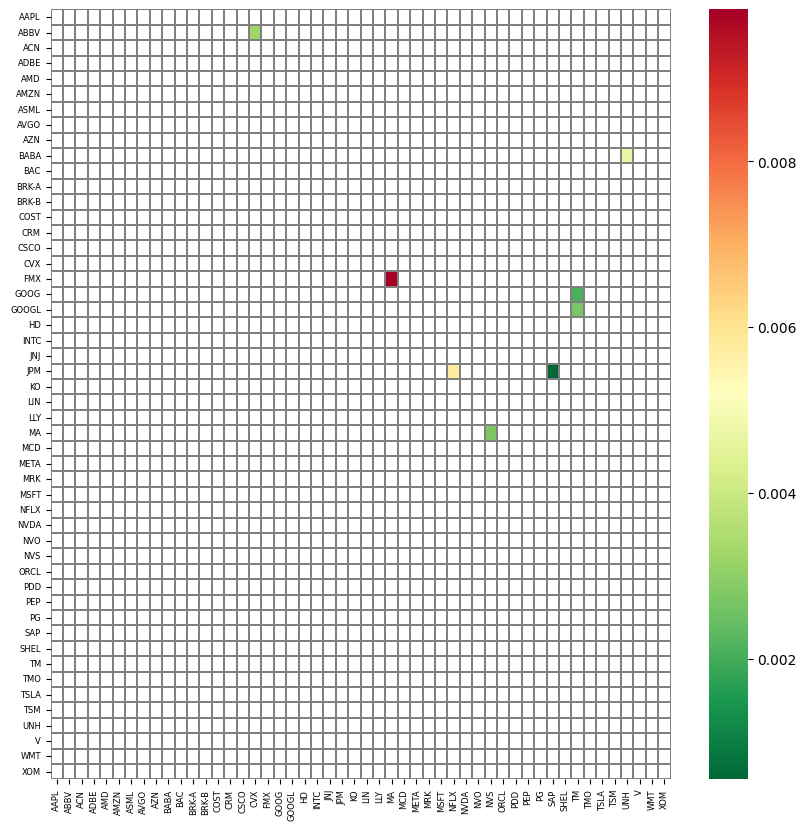

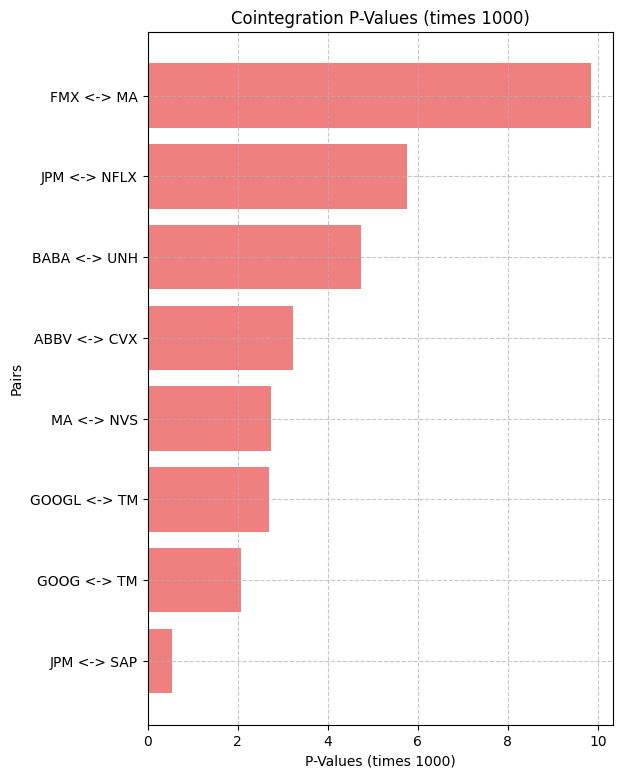

In [ ]:
def find_cointegrated_pairs(sanitized_data, p_value_threshold):
    sanitized = sanitized_data
    tickers = sanitized.columns
    n = len(tickers)
    close_data = np.column_stack([np.array(sanitized[ticker]) for ticker in tickers])
    pvalue_matrix = np.ones((n, n))
    for i, j in combinations(range(n), 2):
        result = coint(close_data[:, i], close_data[:, j])
        pvalue_matrix[i, j] = result[1]
    pairs = [(tickers[i], tickers[j], pvalue_matrix[i, j])
             for i, j in zip(*np.where(pvalue_matrix < p_value_threshold))]
    return pvalue_matrix, pairs

p_value_threshold = 0.01
pvalues, pairs = find_cointegrated_pairs(sanitized, p_value_threshold=p_value_threshold)

plt.figure(figsize=(10, 10))
heatmap = sns.heatmap(pvalues, xticklabels=sanitized.keys(),yticklabels=sanitized.keys(), cmap='RdYlGn_r',mask=(pvalues > (p_value_threshold)),linecolor='gray', linewidths=0.1)
heatmap.set_xticklabels(heatmap.get_xticklabels(),size=6)
heatmap.set_yticklabels(heatmap.get_yticklabels(),size=6)
plt.show()

sorted_pairs = sorted(pairs, key=lambda x: x[2], reverse=False)
sorted_pairs = sorted_pairs[0:35]
sorted_pairs_labels, pairs_p_values = zip(*[(f'{y1} <-> {y2}', p*1000) for y1, y2, p in sorted_pairs])
plt.figure(figsize=(6, 9))
plt.barh(sorted_pairs_labels,pairs_p_values, color='lightcoral')
plt.xlabel('P-Values (times 1000)')
plt.ylabel('Pairs')
plt.title('Cointegration P-Values (times 1000)')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()

According to the above graph, there are a few pairs passing the tests, including (FMX,MA), (JPM,NFLX), (BABA,UNH), (ABBV,CVX), (MA,NVS), (GOOGL,TM), (GOOG,TM) and (JPM,SAP). Let's visualize their price graphs and make an initial assessment of their cointegration status.

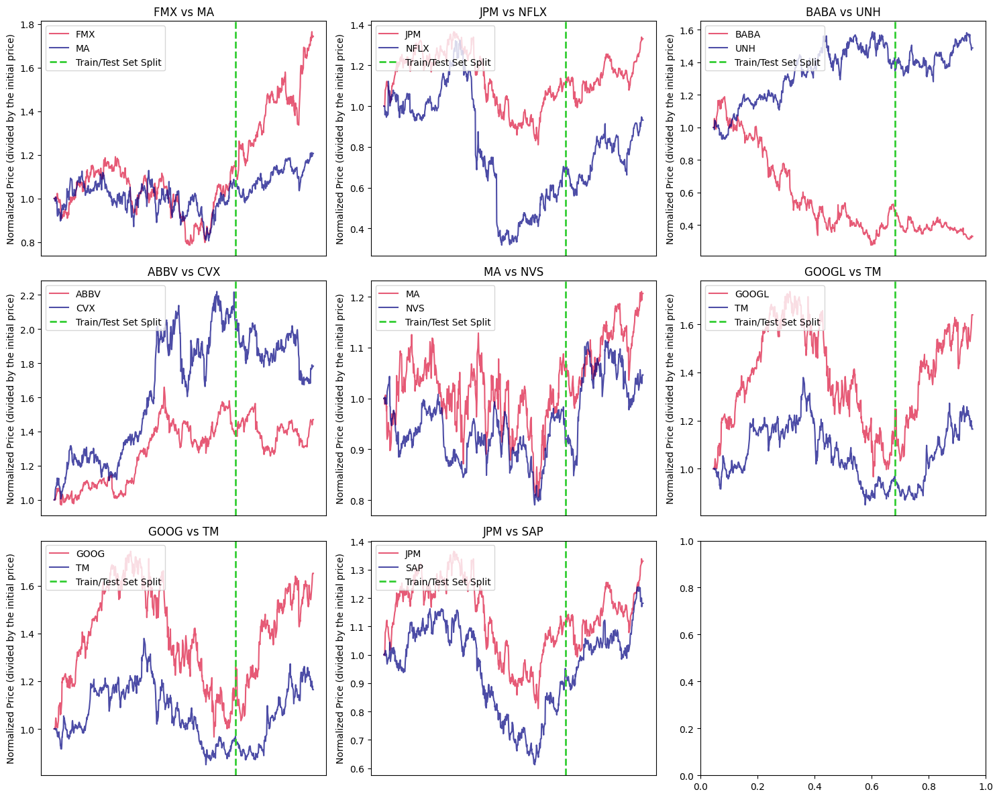

In [ ]:
ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

def Plot_Pair_Graph(ax, ticker1, ticker2):
    ax.plot(sanitized[ticker1] / sanitized[ticker1].iloc[0], label=f'{ticker1}', color='crimson', alpha=0.7)
    ax.plot(sanitized[ticker2] / sanitized[ticker2].iloc[0], label=f'{ticker2}', color='navy', alpha=0.7)
    train = int(len(sanitized[ticker1]) * 0.7)
    train_end_time = sanitized[ticker1].index[train]
    ax.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    ax.set_ylabel('Normalized Price (divided by the initial price)')
    ax.set_title(f'{ticker1} vs {ticker2}')
    ax.legend(loc='upper left')
    ax.set_xticks([])

fig, axs = plt.subplots(len(ticker_pairs)//3 + 1, 3, figsize=(15, 4*(len(ticker_pairs)//3 + 1)))
axs = axs.flatten()

for i, (ticker1, ticker2) in enumerate(ticker_pairs):
    Plot_Pair_Graph(axs[i], ticker1, ticker2)

plt.tight_layout()
plt.show()

I apply the Engle-Ranger test to examine whether they each have a cointegration relationship using statistical methods. According their P-value and t-statistics, we say all of them reject $H_{0}$. That is, all pairs are coitegrated respectively.

In [ ]:
ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  eg_test = engle_granger(sanitized[ticker1], sanitized[ticker2])
  print(f"Engle-Granger Test for {ticker1} vs {ticker2}")
  print(eg_test.summary())
  print()

Engle-Granger Test for FMX vs MA
     Engle-Granger Cointegration Test    
Test Statistic                     -3.903
P-value                             0.010
ADF Lag length                          1
Estimated Root ρ (γ+1)              0.974
-----------------------------------------

Trend: Constant
Critical Values: -3.05 (10%), -3.34 (5%), -3.91 (1%)
Null Hypothesis: No Cointegration
Alternative Hypothesis: Cointegration
Distribution Order: 1

Engle-Granger Test for JPM vs NFLX
     Engle-Granger Cointegration Test    
Test Statistic                     -4.295
P-value                             0.003
ADF Lag length                          0
Estimated Root ρ (γ+1)              0.971
-----------------------------------------

Trend: Constant
Critical Values: -3.05 (10%), -3.34 (5%), -3.91 (1%)
Null Hypothesis: No Cointegration
Alternative Hypothesis: Cointegration
Distribution Order: 1

Engle-Granger Test for BABA vs UNH
     Engle-Granger Cointegration Test    
Test Statistic       

Recall that the price differential as the spread $z_{t}$, defined as follows:

 $$ z_{t}  = y_{1t} - β \cdot y_{2t}, $$

where $β$ is a secret ingredient and $z_{t}$ is stationary and mean reverting. And $z_{t}$ is really what we want to trade. Next, I will attempt to estimate $\beta$ using various methods and substitute different thresholds to construct the pair trading strategies respectively.

Here, we redefine a variable $zscore_{t}$, defined as follows:

$$ zscore_{t}  = \frac{z_{t} - μ_z}{σ_z}, $$
where $μ_{z}$ is the in-the-sample mean of the z spread and  $σ_{z}$ is the in-the-sample standard deviation of the z spread. That is, $zscore_{t}$ is the standardized $z_{t}$.
Utilizing $zscore_{t}$ makes it easier to facilitate the identification of entry and exit signals, as well as the establishment of trading strategies.

Let the portfolio weight be $\mathbf{w}$, denoted by $\mathbf{w}$ $≜$ $[ \frac{1}{1+β} \ \frac{-β}{1+β} ]$.
To ensure consistent total position sizes for all the following trading strategies and facilitate better performance comparison, we introduce an additional constraint to the portfolio weight, $∥\mathbf{w}∥_{1}$=1.

Cumulative P&L is calculated using the following method: the Cumulative P&L of the Traded Spread (with no reinvestment) is determined by applying the formula 1 + cumsum(return), while capital gains tax and transaction fees are disregarded.

### **The Trivial Pair : Fixed Beta Approach**

Directly assume $\beta$ = 1, and set the $z_{t}$ threshold to be 1 and 0.7 respectively.

In this hypothetical scenario, we temporarily disregard the optimal $\beta$ value and use the price difference obtained by subtracting the prices of two target assets in a simple trade as the control group.

In [ ]:
def signals_zscore_evolution(asset1, asset2, ticker1_ts, ticker2_ts, z_threshold, beta):

    train = int(len(ticker1_ts) * 0.7)
    spread = (1/(1+beta))*np.log(ticker1_ts) - ((beta/(1+beta))*np.log(ticker2_ts))
    spread_mean = spread.iloc[0:train].mean(skipna=True)
    spread_var = float(spread.iloc[0:train].var(skipna=True))
    Z_score = (spread - spread_mean) / np.sqrt(spread_var)
    Z_score.columns = ["Z-score"]

    threshold_short = z_threshold
    threshold_long = -z_threshold

    signal = Z_score.copy()
    signal = pd.DataFrame(signal, columns=["signal"])
    signal[:] = np.nan

    long_freq, short_freq = 0,0
    # initial position
    signal.iloc[0] = 0
    if Z_score.iloc[0] <= threshold_long:
        signal.iloc[0] = 1
        long_freq += 1
    elif Z_score.iloc[0] >= threshold_short:
        signal.iloc[0] = -1
        short_freq += 1
    # loop
    for t in range(1, len(Z_score)):
        if (signal.iloc[t-1] == 0).all():  # if we were in no position
            if (Z_score.iloc[t] <= threshold_long).all():
                signal.iloc[t] = 1
                long_freq += 1
            elif (Z_score.iloc[t] >= threshold_short).all():
                signal.iloc[t] = -1
                short_freq += 1
            else:
                signal.iloc[t] = 0
        elif (signal.iloc[t-1] == 1).all():  # if we were in a long position
            if (Z_score.iloc[t] >= 0).all():
                signal.iloc[t] = 0
            else:
                signal.iloc[t] = signal.iloc[t-1]
        else:  # if we were in a short position
            if (Z_score.iloc[t] <= 0).all():
                signal.iloc[t] = 0
            else:
                signal.iloc[t] = signal.iloc[t-1]

    spread_return = np.squeeze(np.array(spread.diff()))
    lagged_signal = np.squeeze(np.array(signal.shift(1))) # NOTE THE SHIFT!
    traded_return = spread_return*lagged_signal
    traded_return = np.nan_to_num(traded_return, nan=0)
    traded_return = {"traded spread":traded_return}
    traded_return = pd.DataFrame(traded_return)
    traded_return.index = spread.index

    plt.figure(figsize=(10, 6))
    plt.subplot(3, 1, 1)
    plt.plot(Z_score, label="Z-score", color="black")
    plt.plot(signal, label="Trading Signal", linestyle="--", color="crimson")

    train_end_time = ticker1_ts.index[train]
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')

    plt.grid()
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(asset1 +" & " + asset2 + ' Z-score and Trading Signal')
    plt.legend(loc='upper left')

    # Plot Return of Traded Spread
    plt.subplot(3, 1, 2)
    plt.plot(traded_return.index, traded_return["traded spread"], label="Traded Spread Return", color="slategray")
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time')
    plt.ylabel('Return')
    plt.title(asset1 +" & " + asset2 +' Return of Traded Spread')
    plt.legend(loc='upper left')
    plt.grid()

    # Plot Cumulative P&L of Traded Spread (No Reinvestment)
    plt.subplot(3, 1, 3)
    cum_pnl = 1 + traded_return.cumsum()
    plt.plot(cum_pnl.index, cum_pnl["traded spread"], label="Cumulative P&L (no reinvestment)", color="steelblue")
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time') 
    plt.ylabel('Cumulative P&L')
    plt.title(asset1 +" & " + asset2 + ' Cumulative P&L of Traded Spread (No Reinvestment)')
    plt.legend(loc='upper left')
    plt.grid()

    plt.tight_layout()
    plt.show()

    return cum_pnl, [long_freq, short_freq]

In [ ]:
def Trivial_Pair(ticker1_ts, ticker2_ts, asset1, asset2, z_threshold):
    asset1_ts = sanitized[asset1]
    asset2_ts = sanitized[asset2]

    trivial_pair = signals_zscore_evolution(asset1, asset2, asset1_ts, asset2_ts, z_threshold, 1)
    print()
    return trivial_pair

(i) Set the threshold = 1:

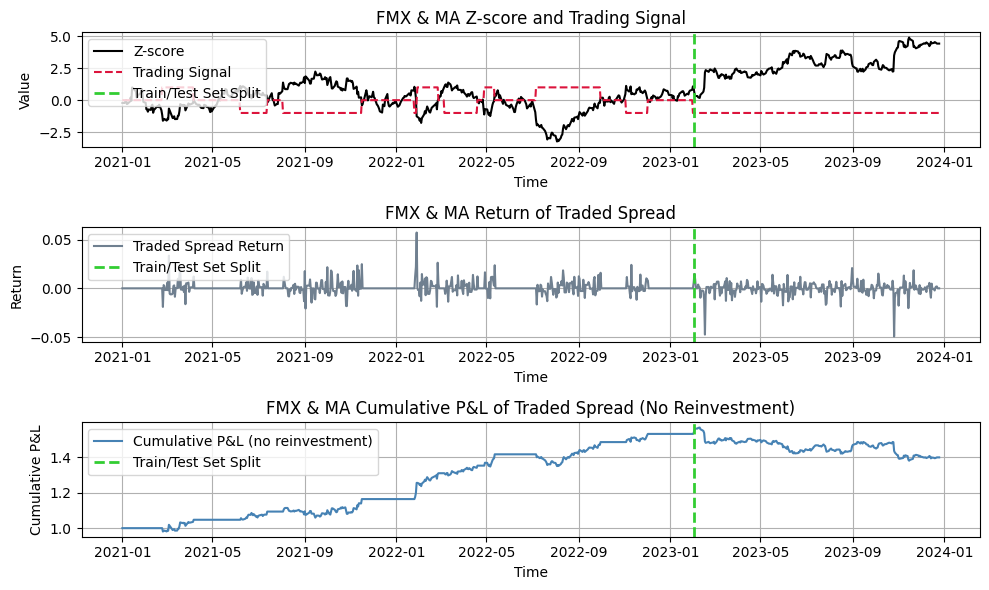

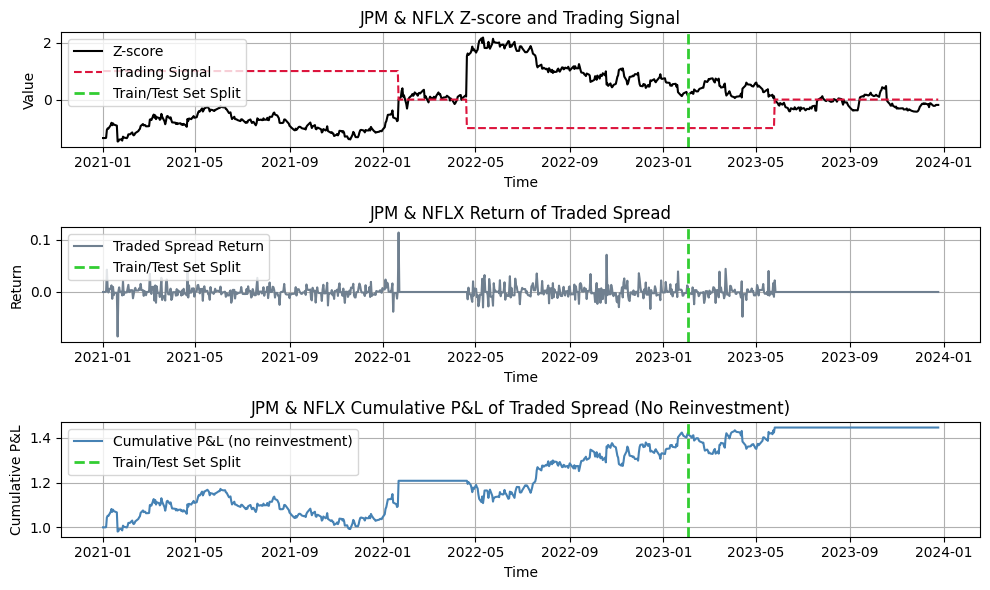

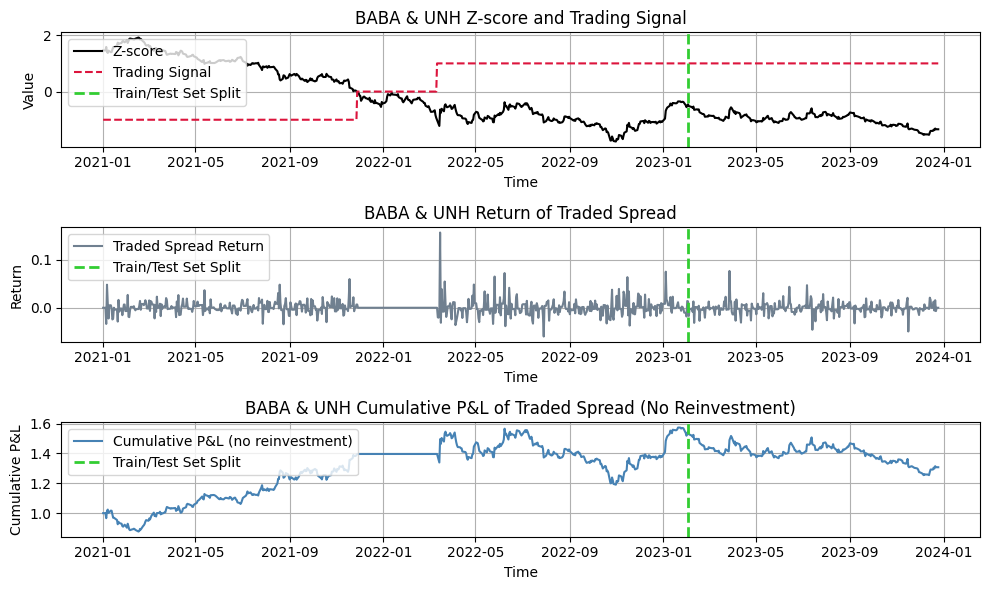

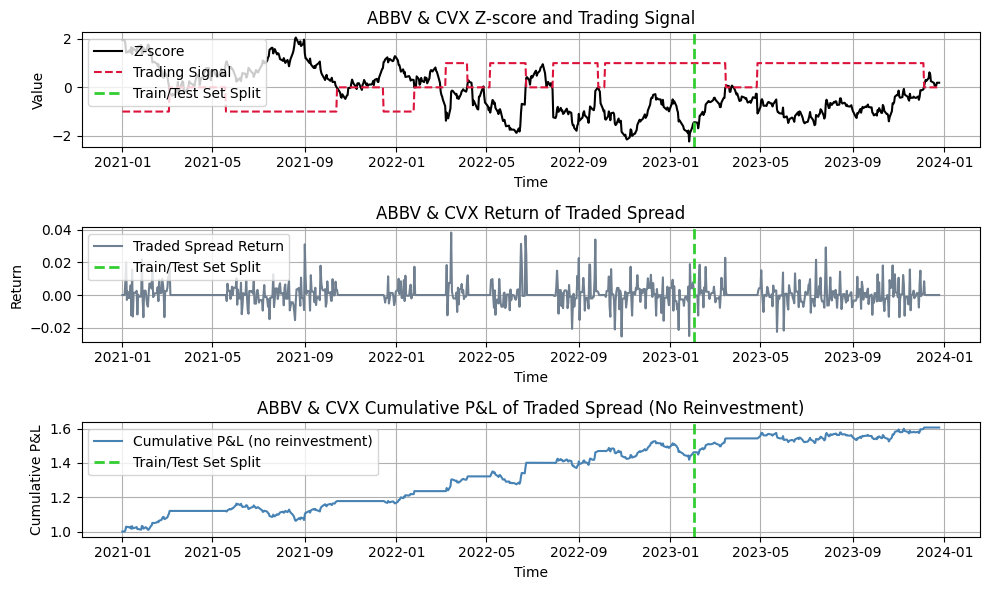

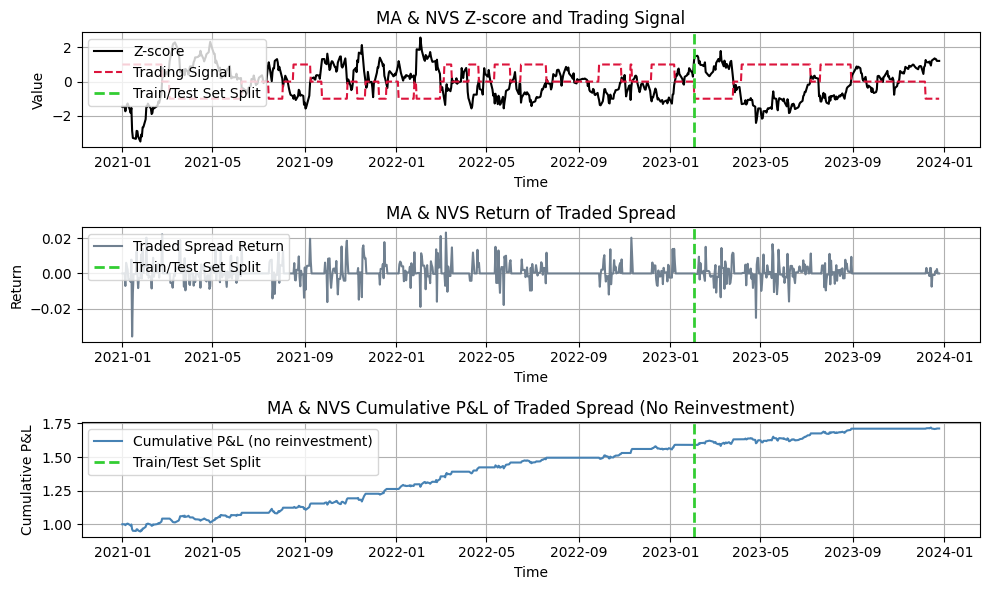

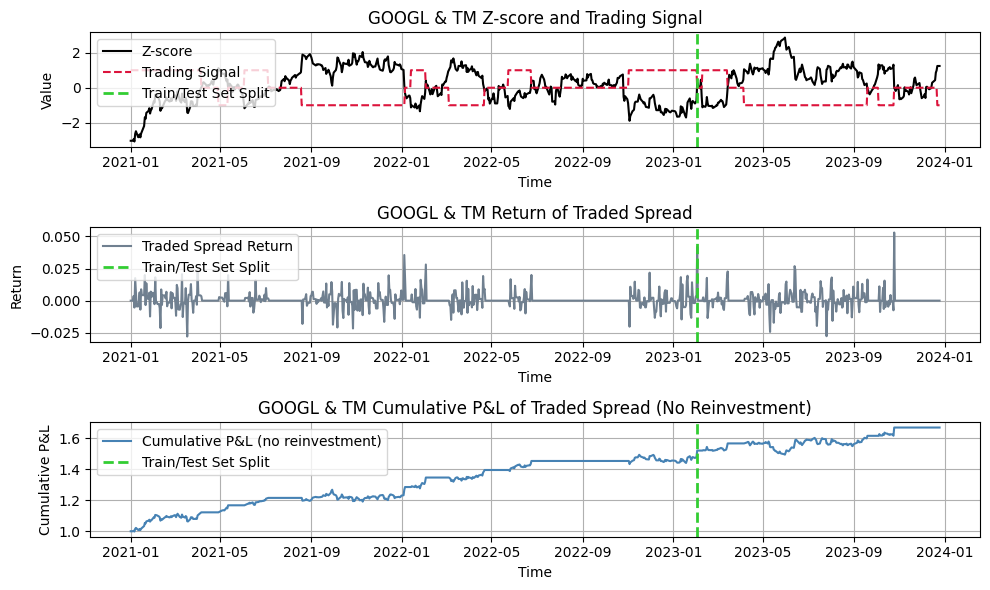

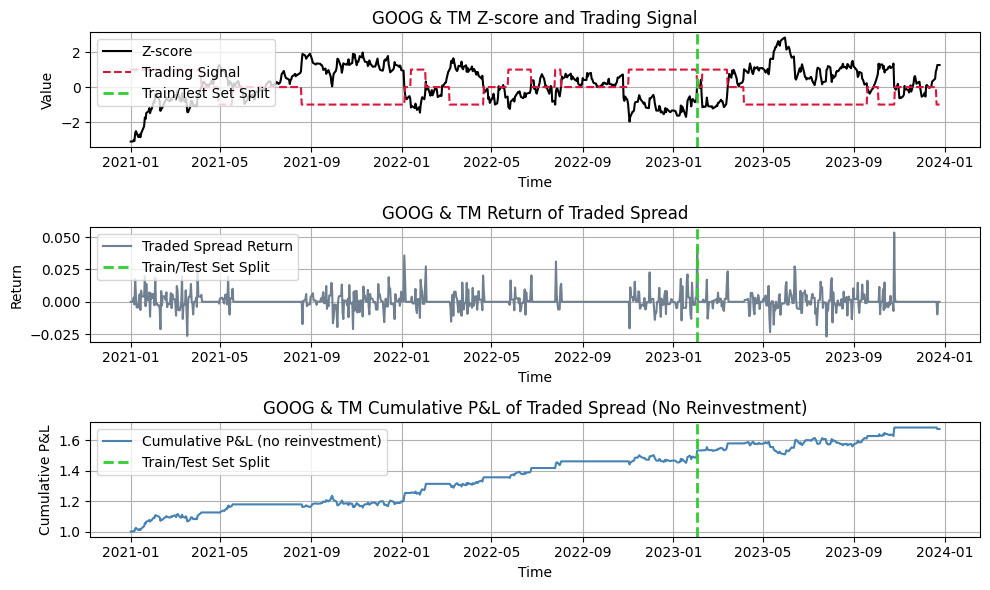

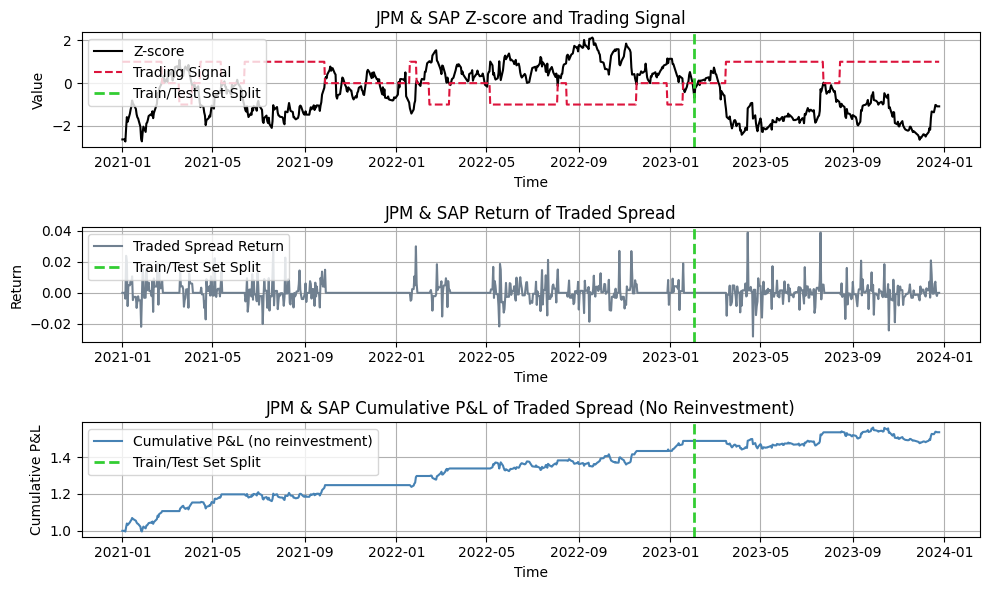

In [ ]:
ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

trivial_threshold01_dict = {}
for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  tick1, tick2 = sanitized[ticker1],sanitized[ticker2]
  trivial_pair = Trivial_Pair(tick1, tick2, ticker1, ticker2, 1)
  pair_name = ticker1+' & '+ticker2
  trivial_threshold01_dict[pair_name] = trivial_pair

(ii) Set the threshold = 0.7:

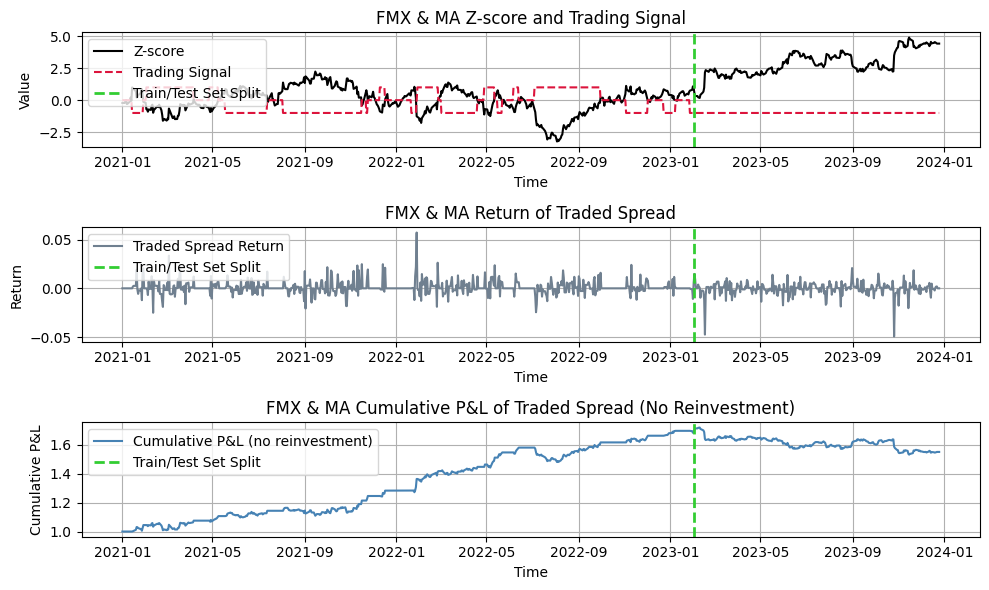

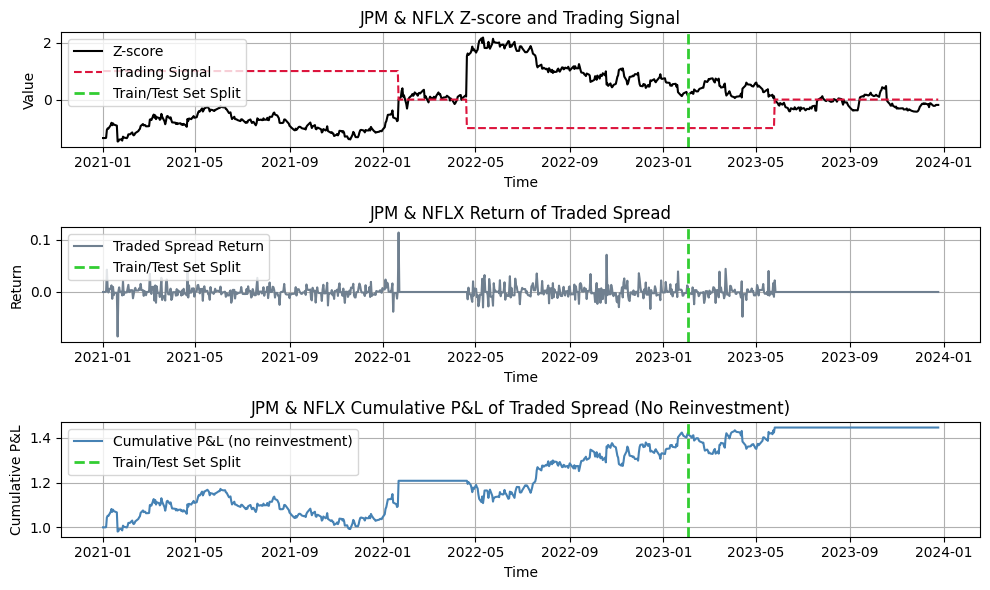

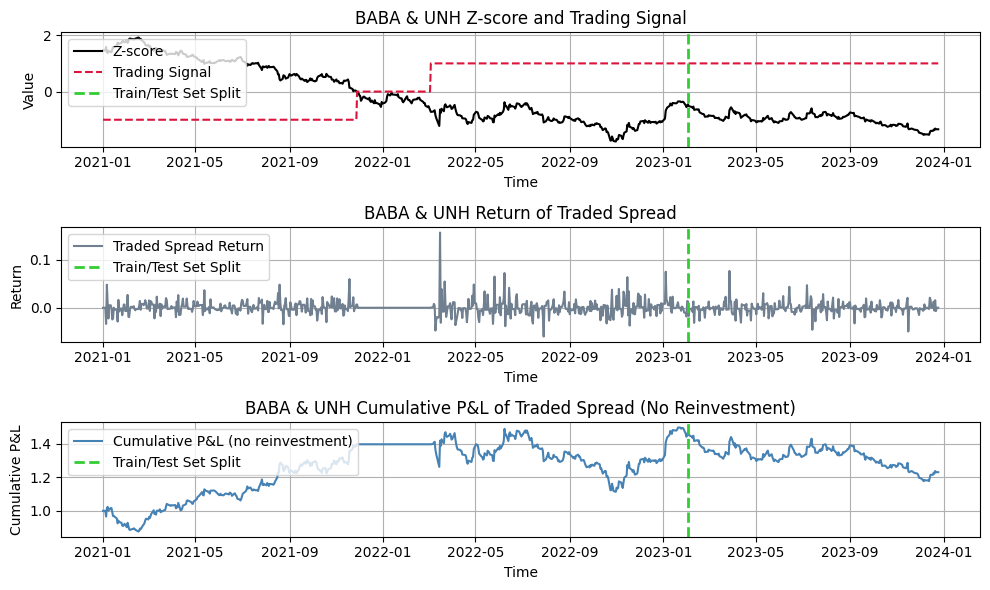

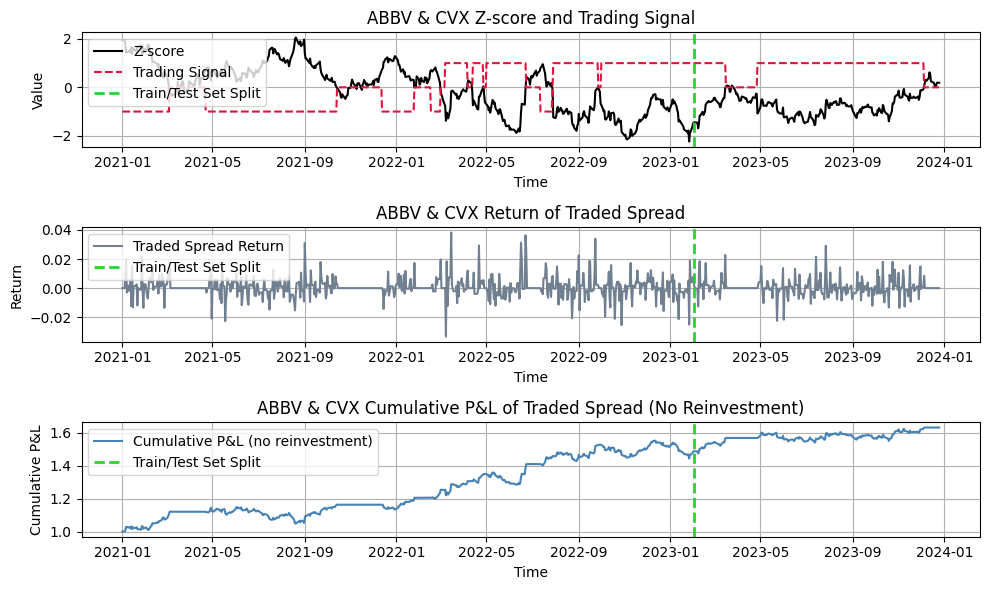

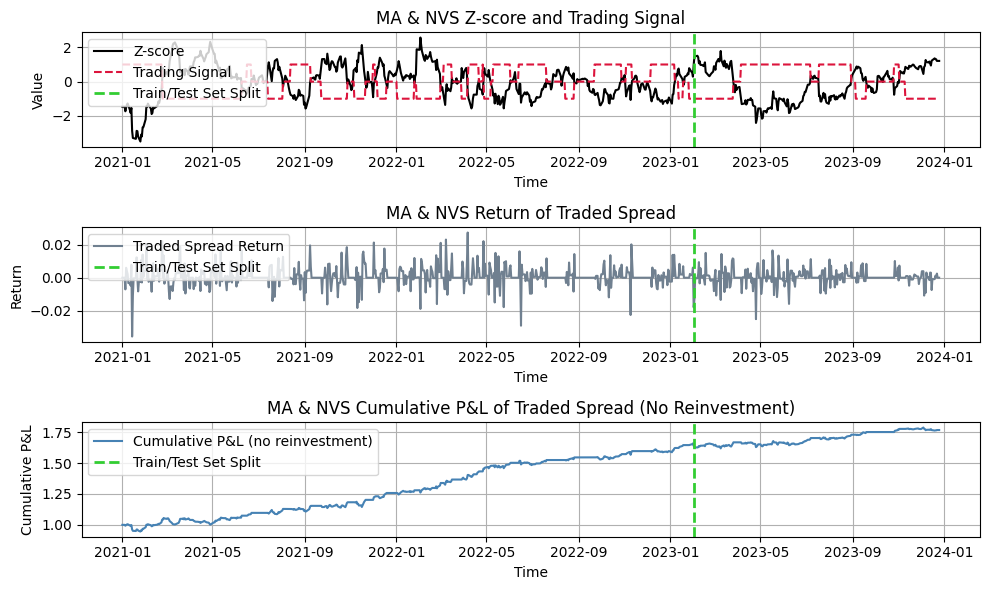

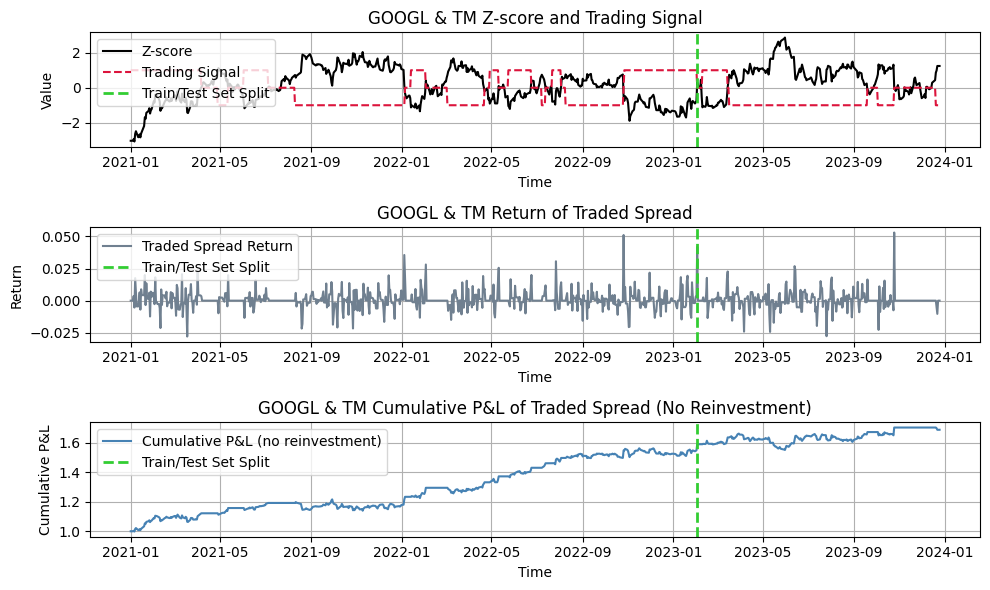

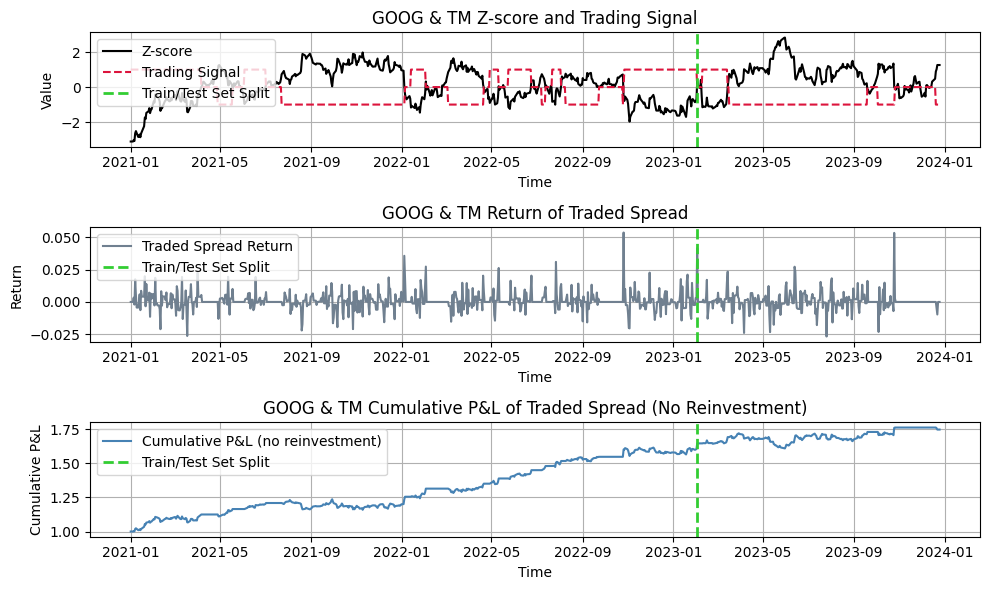

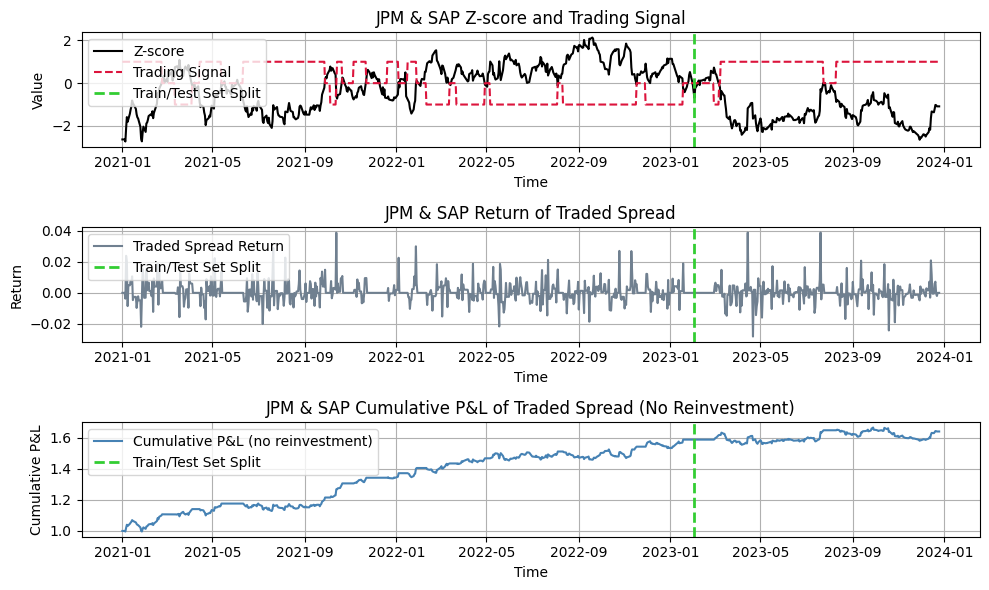

In [ ]:
ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

trivial_threshold02_dict = {}
for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  tick1, tick2 = sanitized[ticker1],sanitized[ticker2]
  trivial_pair = Trivial_Pair(tick1, tick2, ticker1, ticker2, 0.7)
  pair_name = ticker1+' & '+ticker2
  trivial_threshold02_dict[pair_name] = trivial_pair

Next, let's use quantitative method to compare how different $Z_{t}$ spread thresholds influence the strategy and the trading frequency.

In [ ]:
def Threshold_TF_Comparison(trivial_threshold_dict, threshold):
  # Print Complete Comparison Results

  ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]
  dict_long_short = {}
  for i, (ticker1, ticker2) in enumerate(ticker_pairs):

     pair_name = ticker1+' & '+ticker2
     long_freq, short_freq = trivial_threshold_dict[pair_name][1]
     dict_long_short[pair_name] = long_freq, short_freq

  return dict_long_short

# (long_freq, short_freq)  The former is the long_freq, and the latter is the short_freq
comparison01 = Threshold_TF_Comparison(trivial_threshold01_dict, 1)
comparison02 = Threshold_TF_Comparison(trivial_threshold02_dict, 0.7)

print(comparison01)
print(comparison02)

{'FMX & MA': (4, 6), 'JPM & NFLX': (1, 1), 'BABA & UNH': (1, 1), 'ABBV & CVX': (5, 3), 'MA & NVS': (11, 9), 'GOOGL & TM': (6, 6), 'GOOG & TM': (6, 6), 'JPM & SAP': (6, 5)}
{'FMX & MA': (7, 10), 'JPM & NFLX': (1, 1), 'BABA & UNH': (1, 1), 'ABBV & CVX': (6, 5), 'MA & NVS': (15, 14), 'GOOGL & TM': (8, 8), 'GOOG & TM': (8, 9), 'JPM & SAP': (9, 8)}


Next, let's use quantitative method to compare how different  Zt  spread thresholds influence the performance, especially for out-of-the sample.

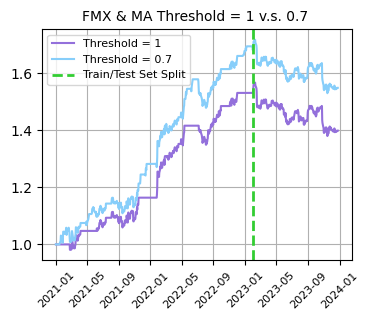

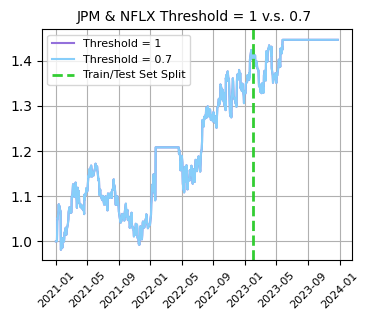

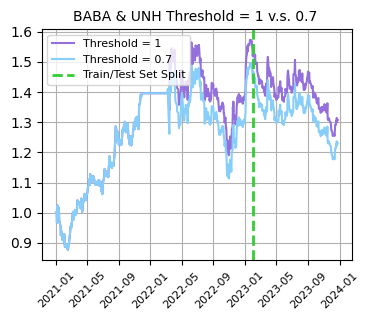

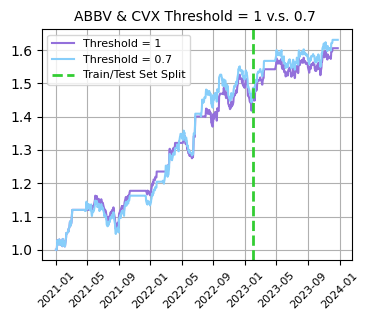

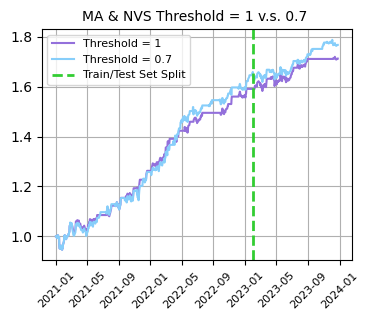

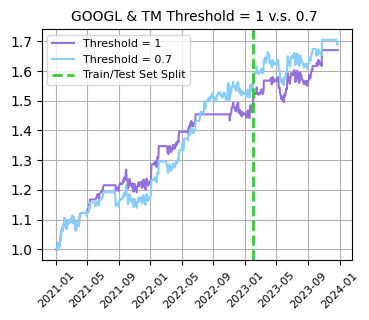

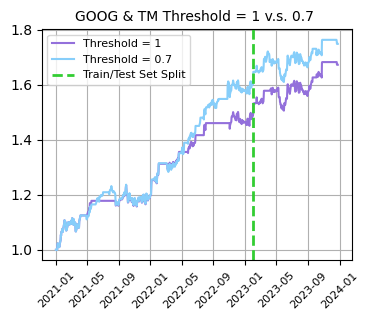

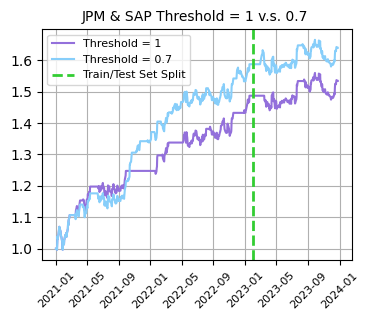

In [ ]:
def OTS_Comparison_Threshold(dict01, dict02):
  ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]
  dict_long, dict_short = {}, {}
  for i, (ticker1, ticker2) in enumerate(ticker_pairs):
     pair_name = ticker1+' & '+ticker2
     pl01 = dict01[pair_name][0]
     pl02 = dict02[pair_name][0]

     f = plt.figure(figsize=(4, 3))
     plt.title(pair_name + ' Threshold = 1 v.s. 0.7 ',fontsize=10)
     plt.plot(pl01, label='Threshold = 1', color = 'mediumpurple')
     plt.plot(pl02, label='Threshold = 0.7', color = 'lightskyblue')
     plt.xticks(rotation=45,fontsize=8)

     ticker_ts = sanitized["FMX"]
     train = int(len(ticker_ts) * 0.7)
     train_end_time = ticker_ts.index[train]
     plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')

     plt.legend(fontsize=8,loc='upper left')  # Add legend to display labels
     plt.grid()
     plt.show()
     print()
  return

# (long_freq, short_freq)  The former is the long_freq, and the latter is the short_freq
ots_comparison_trivial = OTS_Comparison_Threshold(trivial_threshold01_dict,trivial_threshold02_dict)

**Conclusion**

(i) Different $Z_{t}$ spread thresholds influence the strategy and the trading frequency. The lower spread thresholds, the higher the trading frequency.

(ii) Setting a lower threshold indicates a more aggressive approach to the trading strategy. However, when the threshold is set too low, it may result in the blurring of trading signals and frequent entries and exits. Without considering transaction costs, we can observe from the above charts that a threshold of 0.7 performs better in the majority of pairs.

(iii) We know that $\beta$ is determined by OLS and it may not be equal to 1. When $\beta$ = 1, it implies we trade the original price difference. According to the result, assuming $\beta$ = 1 makes performance of the trading strategy poor because the original price difference may not be coitegrated and mean-reverting. That is, finding the proper $\beta$ is an important mission for constructing a pair trading strategy.

### **The OLS Beta Approach**

Utilize OLS to get $\beta$ and set the $z_{t}$ threshold to be 1 and 0.7 respectively.



In [ ]:
def OLS_Pair(ticker1_ts, ticker2_ts, asset1, asset2, z_threshold):
    train = int(len(ticker1_ts) * 0.7)
    Y, X = np.log(ticker1_ts[:train]), np.log(ticker2_ts[:train])
    X = sm.add_constant(X)
    model = sm.OLS(Y,X)
    results = model.fit()
    mu, beta = results.params[0], results.params[1]

    ols_pair = signals_zscore_evolution(asset1, asset2, ticker1_ts, ticker2_ts, z_threshold, beta)
    print()
    return ols_pair


(i) Set the threshold = 1:

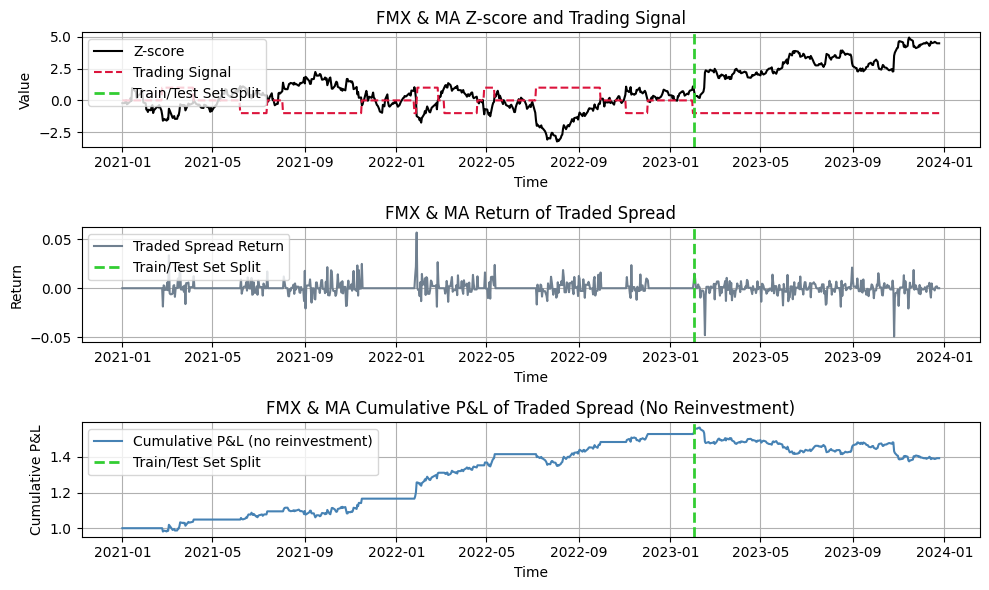

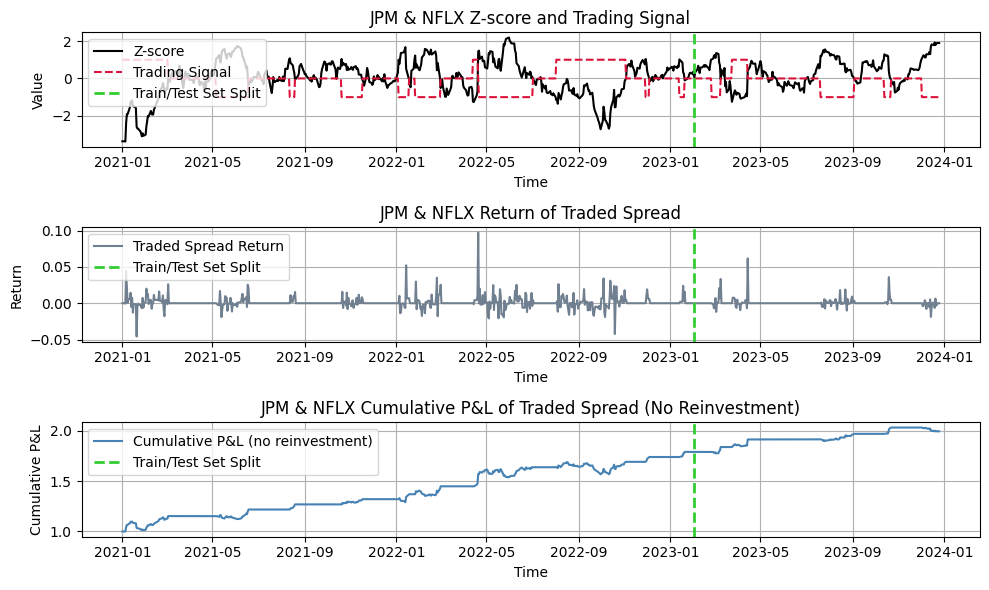

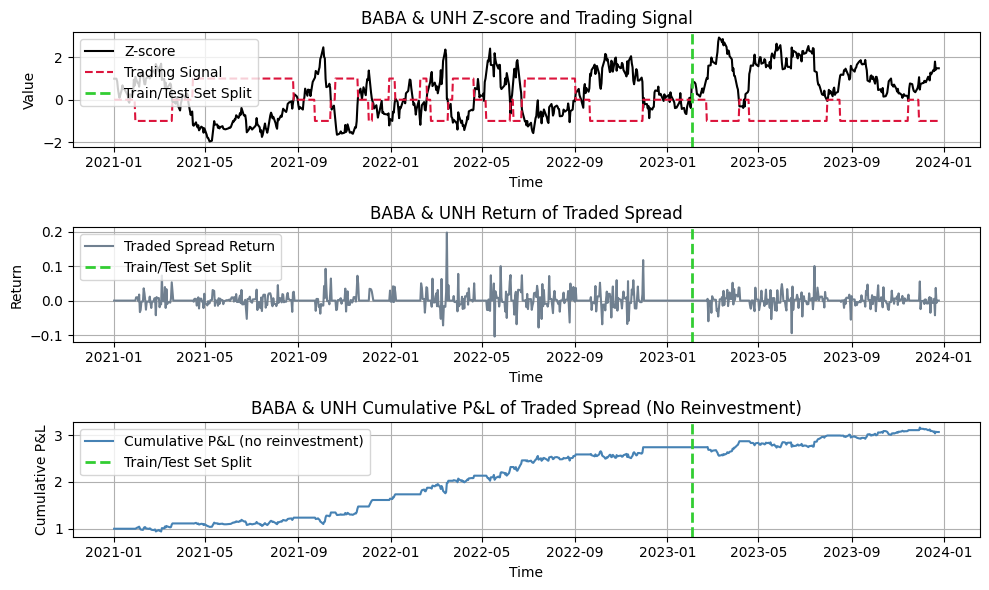

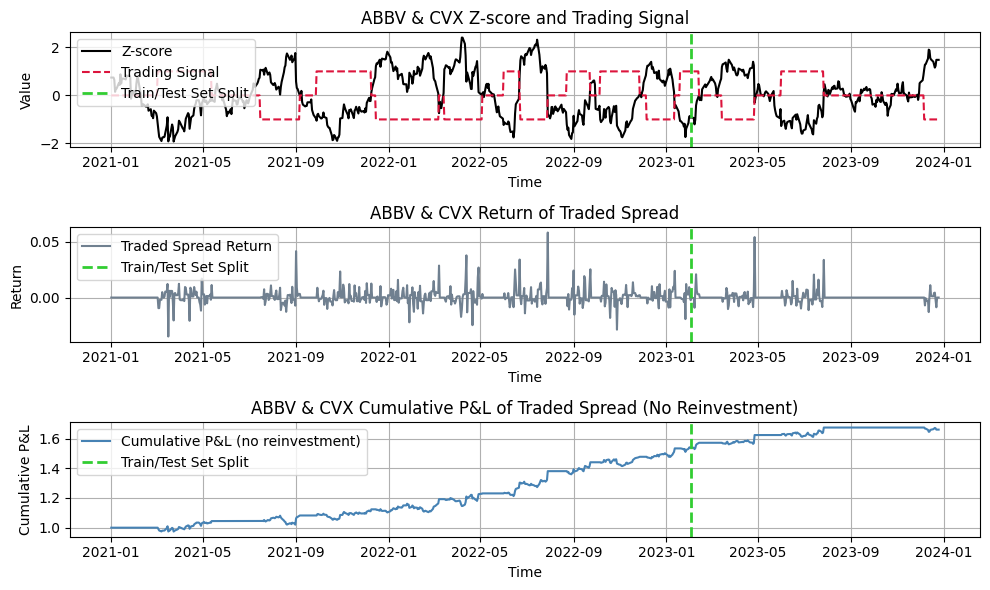

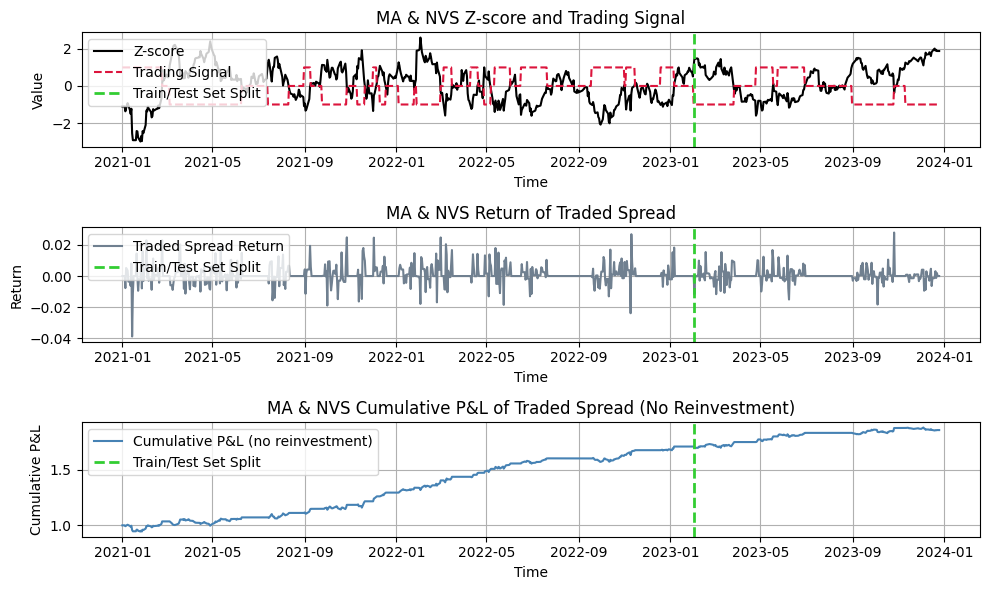

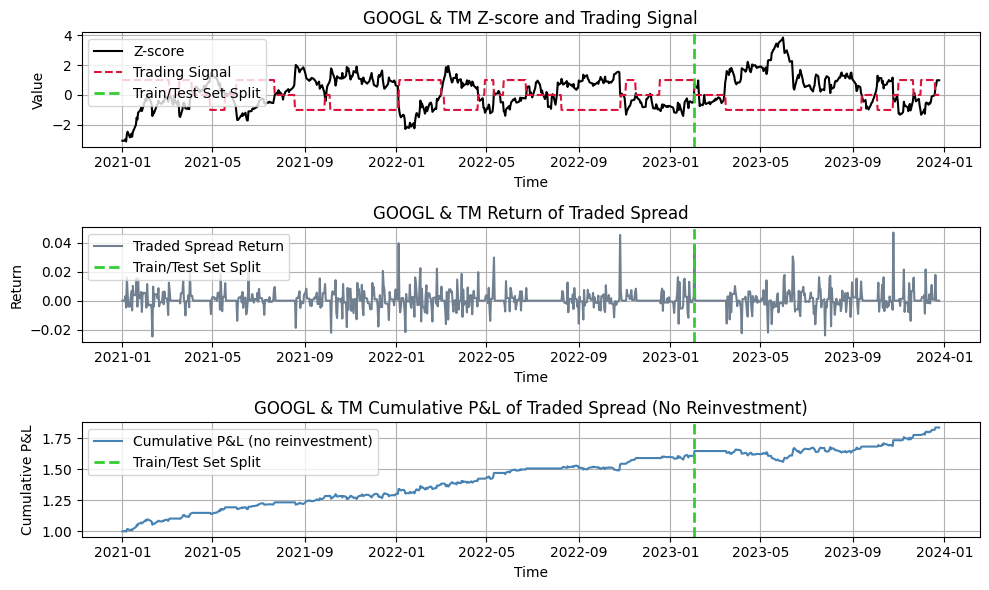

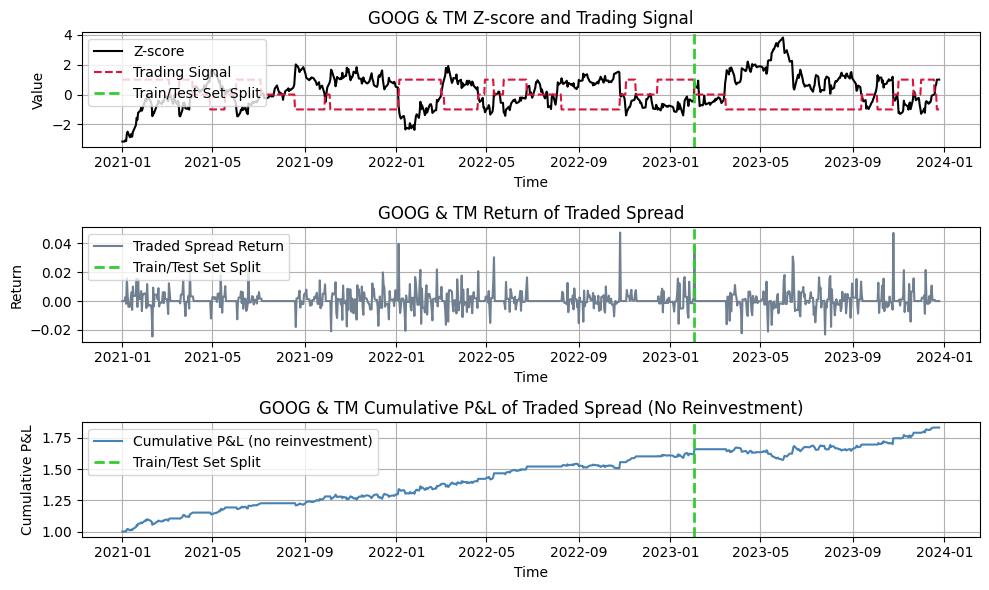

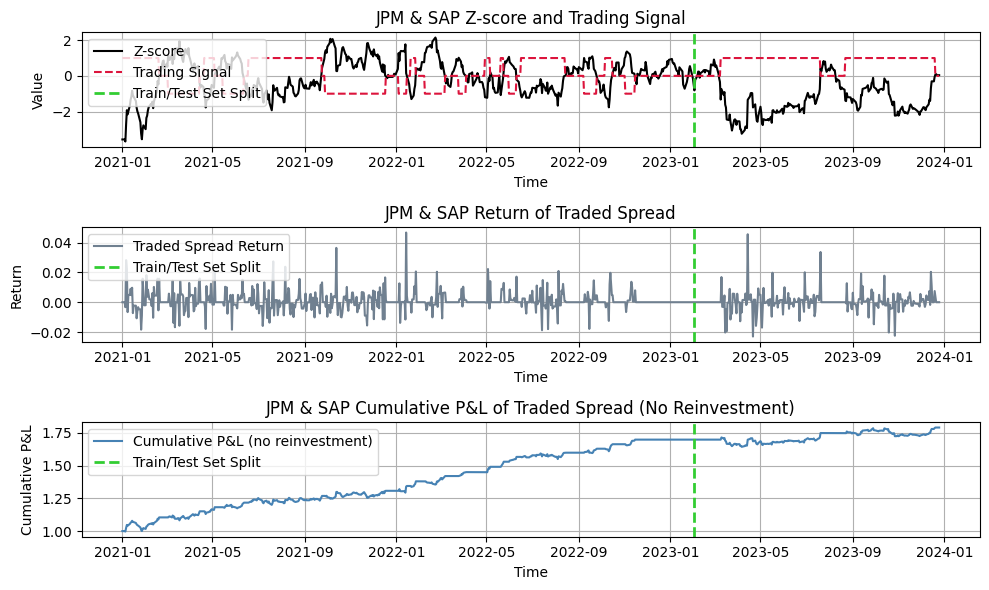

In [ ]:
ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

ols_threshold01_dict = {}
for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  tick1, tick2 = sanitized[ticker1],sanitized[ticker2]
  ols_pair = OLS_Pair(tick1, tick2, ticker1, ticker2, 1)
  pair_name = ticker1+' & '+ticker2
  ols_threshold01_dict[pair_name] = ols_pair

(ii) Set the threshold = 0.7:

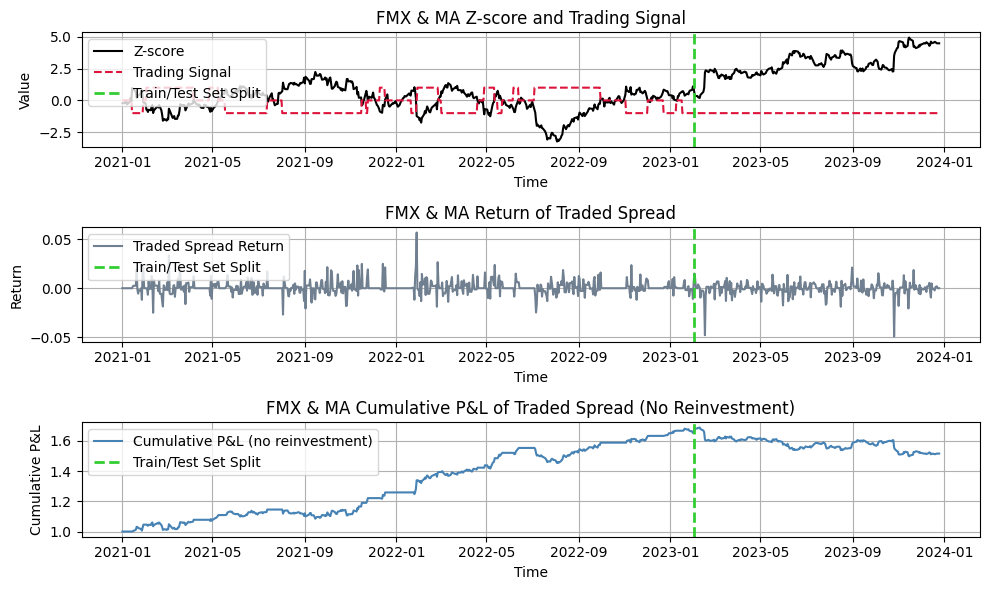

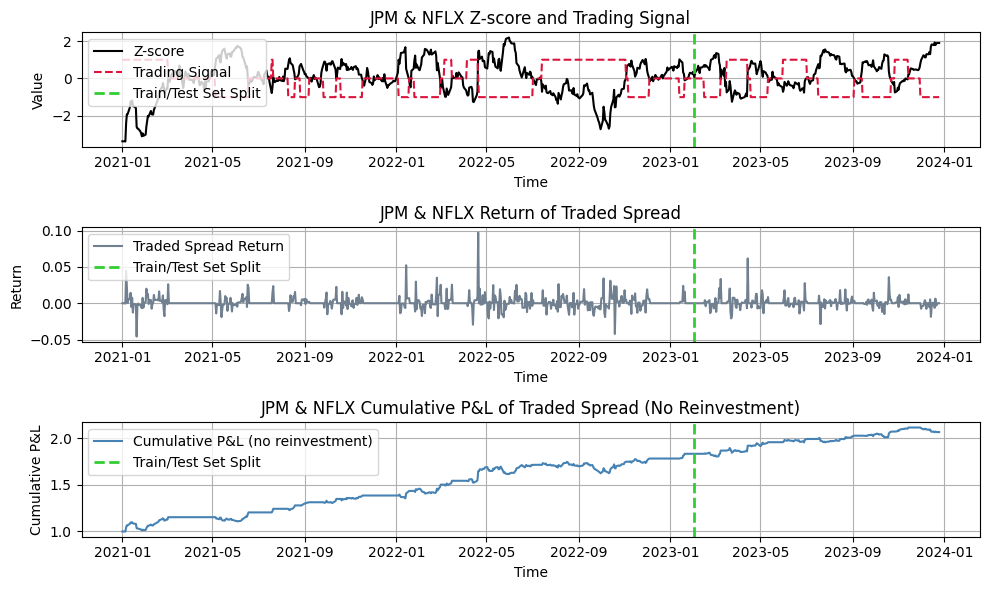

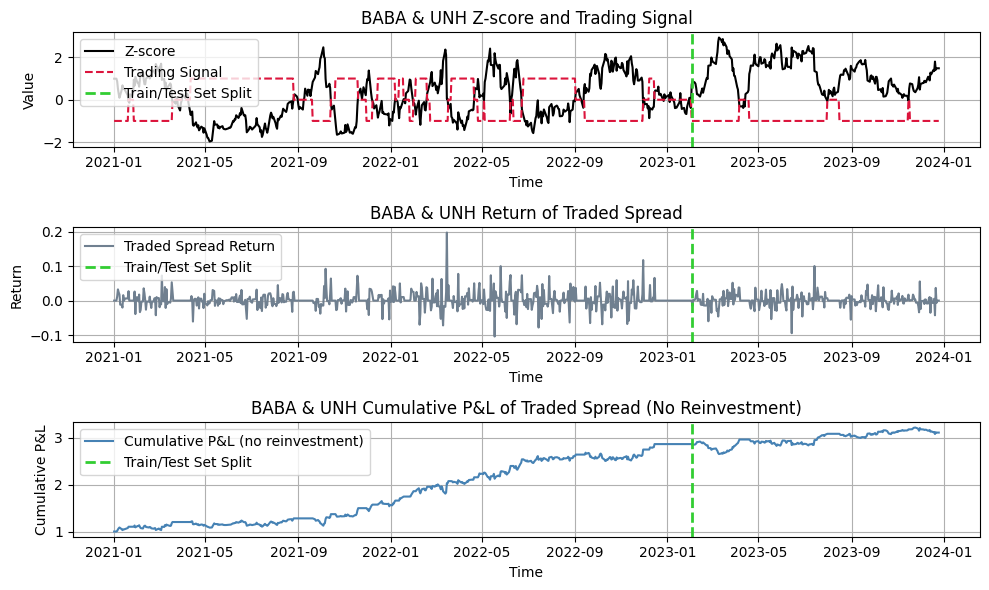

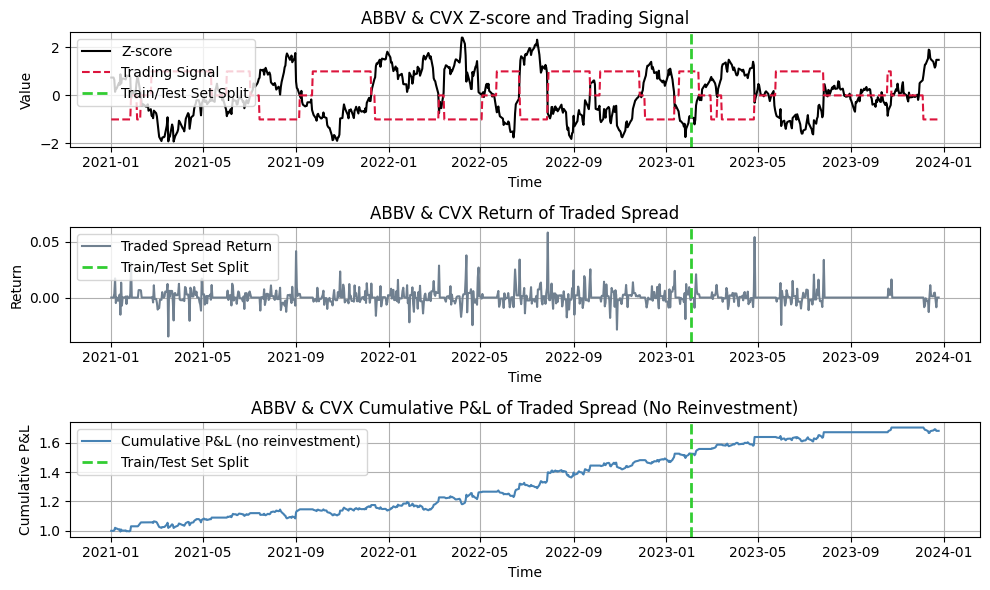

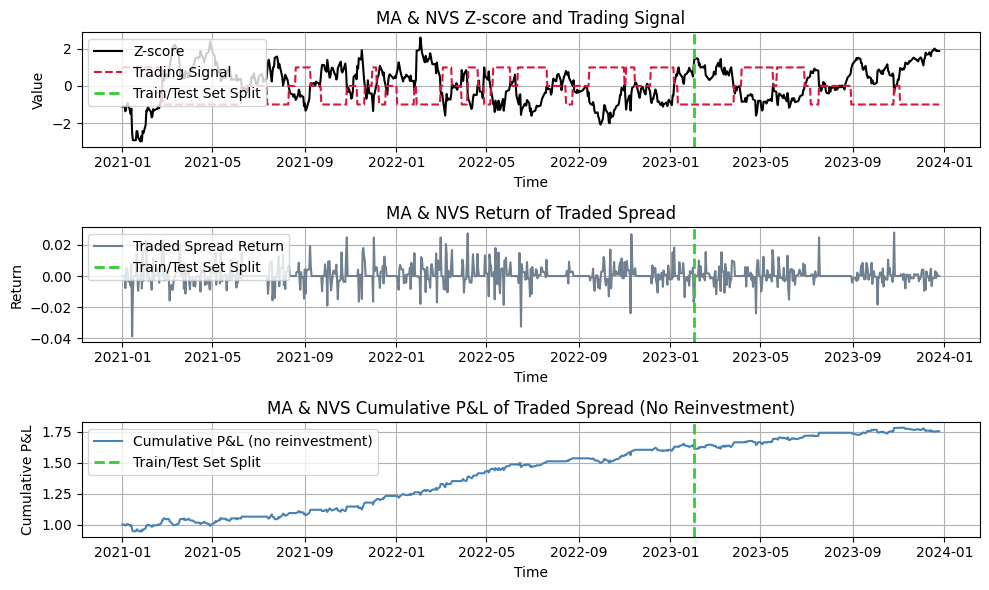

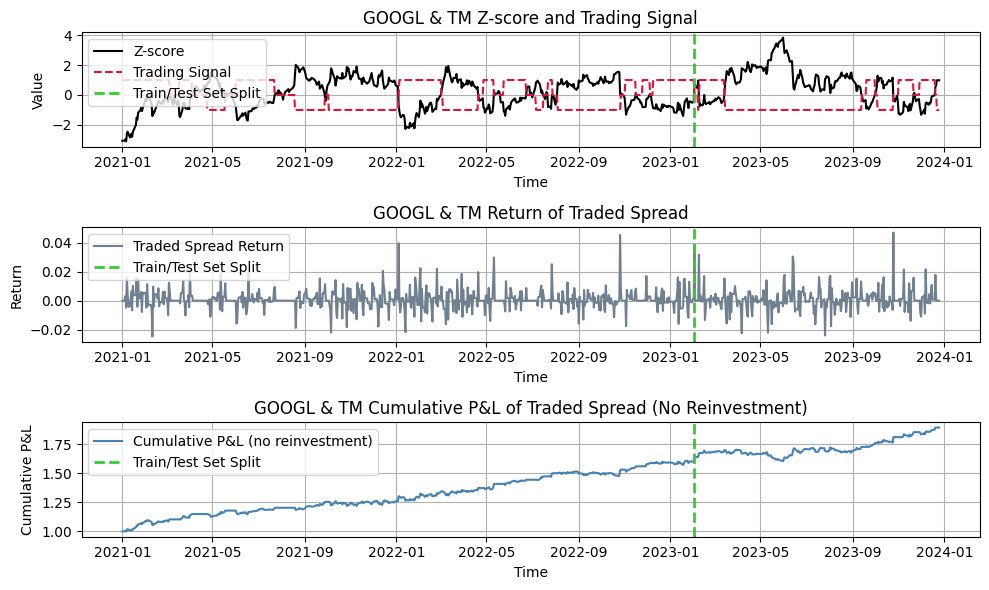

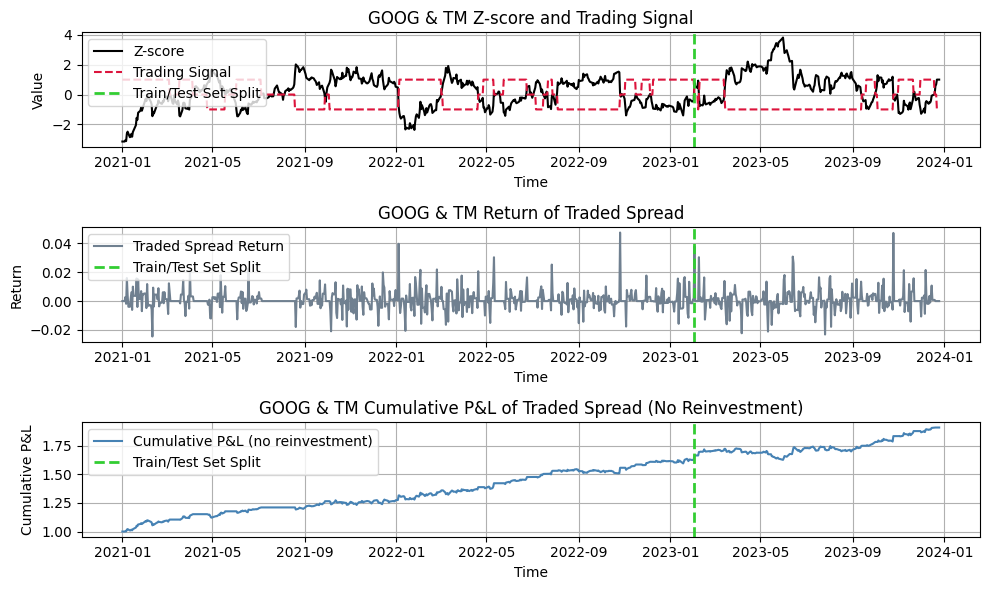

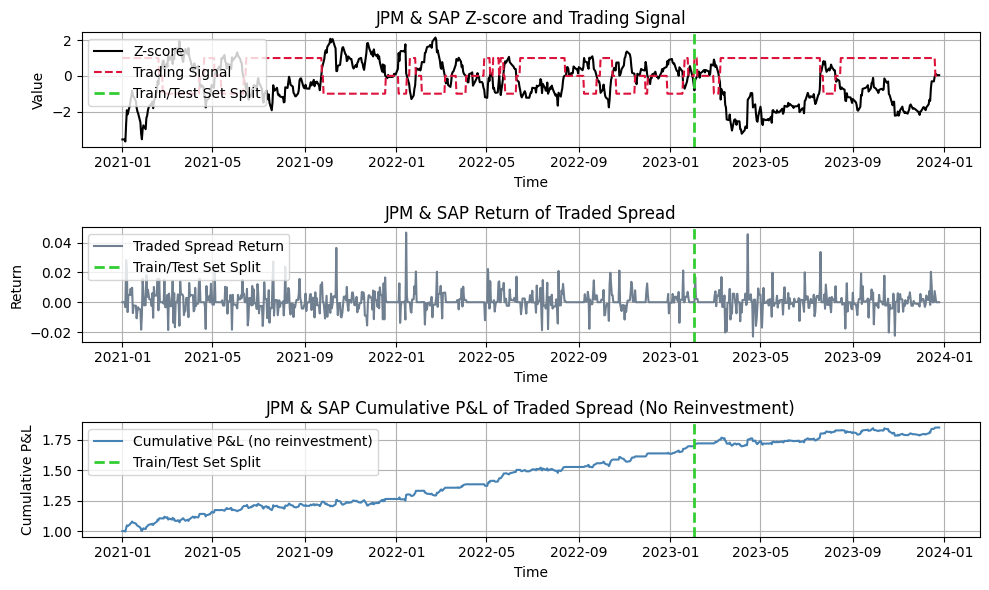

In [ ]:
ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

ols_threshold02_dict = {}

for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  tick1, tick2 = sanitized[ticker1],sanitized[ticker2]
  ols_pair = OLS_Pair(tick1, tick2, ticker1, ticker2, 0.7)
  pair_name = ticker1+' & '+ticker2
  ols_threshold02_dict[pair_name] = ols_pair

Next, let's use quantitative method to compare how different $Z_{t}$ spread thresholds influence the strategy and the trading frequency.

In [ ]:
comparison01 = Threshold_TF_Comparison(ols_threshold01_dict, 1)
comparison02 = Threshold_TF_Comparison(ols_threshold02_dict, 0.7)
print(comparison01)
print(comparison02)

{'FMX & MA': (4, 6), 'JPM & NFLX': (4, 12), 'BABA & UNH': (6, 11), 'ABBV & CVX': (7, 7), 'MA & NVS': (12, 11), 'GOOGL & TM': (10, 7), 'GOOG & TM': (10, 8), 'JPM & SAP': (10, 9)}
{'FMX & MA': (7, 10), 'JPM & NFLX': (8, 15), 'BABA & UNH': (8, 14), 'ABBV & CVX': (9, 10), 'MA & NVS': (12, 14), 'GOOGL & TM': (14, 10), 'GOOG & TM': (14, 10), 'JPM & SAP': (13, 13)}


Next, let's use quantitative method to compare how different Zt spread thresholds influence the performance, especially for out-of-the sample.

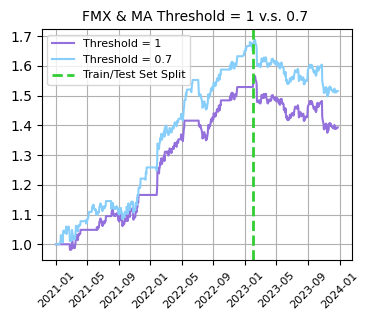

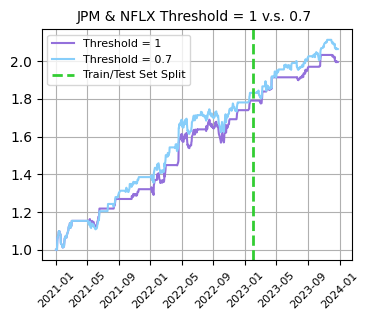

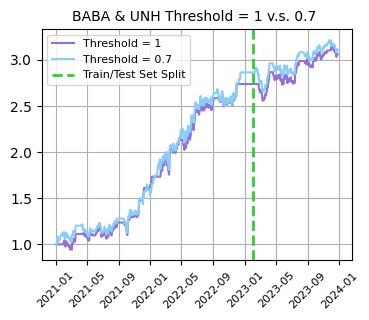

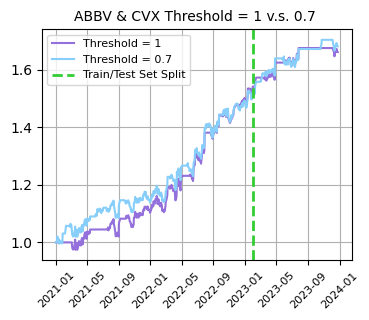

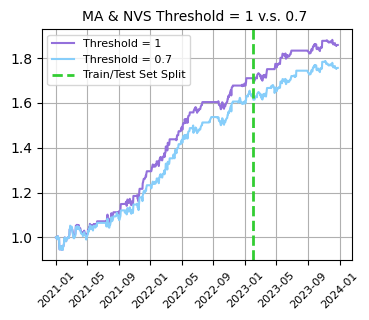

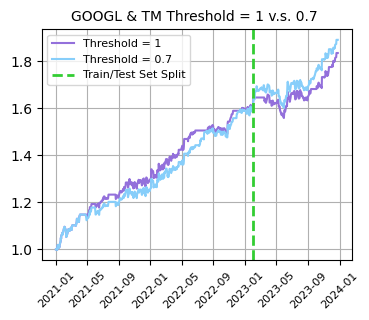

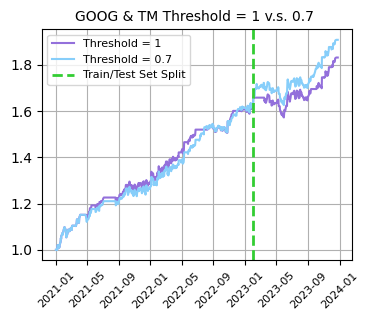

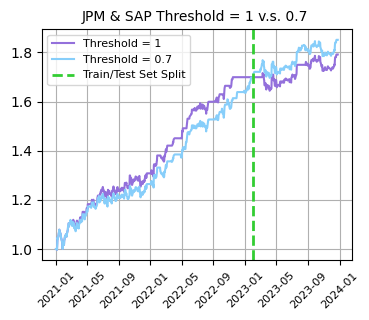

In [ ]:
ots_comparison_ols = OTS_Comparison_Threshold(ols_threshold01_dict,ols_threshold02_dict)

**Conclusion**

(i) Samely, different $Z_{t}$ spread thresholds influence the strategy and the trading frequency. The lower spread thresholds, the higher the trading frequency.

(ii) Different from the trivial pair, without considering transaction costs, it is challenging to definitively say whether setting the threshold at 1 or 0.7 performs better based on the above images.

(iii) The $\beta$ obtained from the Ordinary Least Squares (OLS) method may be more appropriate than setting it directly to 1, as it is the same as the $\beta$ we obtain from the cointegration test. As we see in the above graphs, the OLS $\beta$ outperforms than setting it directly to 1.

### **The Rolling OLS Beta Approach**

In this subsection, we utilize "rolling OLS" to get time-varying $\beta$ and set the $z_{t}$ threshold to be 1.

Samely, we assume there are two nonstationary (log-) price time series, $y_{1,t}$ and $y_{2,t}$, it searches for parameters $α_{t}$, $β_{t}$, and $ρ_{t}$ such that


\begin{align*}
y_{1,t} &=α_{t}+β_{t} \cdot y_{2,t}+ res_{t}, \\
\text{res}_{t} &=ρ_{t}\cdot res_{t−1} + ϵ_{t}, \\
\end{align*}

where $α_{t}$ as well as $β_{t}$ are time-varying parameters, $res_{t}$ is the residual and $ϵ_{t}$ is the innovation. If |$ρ_{t}$| < 1
, then we say $y_{1,t}$ and $y_{2,t}$ are cointegrated.

And we refer to the price differential as the spread $z_{t}$, defined as follows:

 $$ z_{t}  = y_{1t} - β_{t} \cdot y_{2t}, $$

where $β_{t}$ is a secret ingredient we can get from the rolling OLS.

(i) Set the threshold = 1 and rolling frequently:

The rolling window method requires a minimum of 125 data points (approximately half a year of daily trading data), with one additional data point added for each additional day.

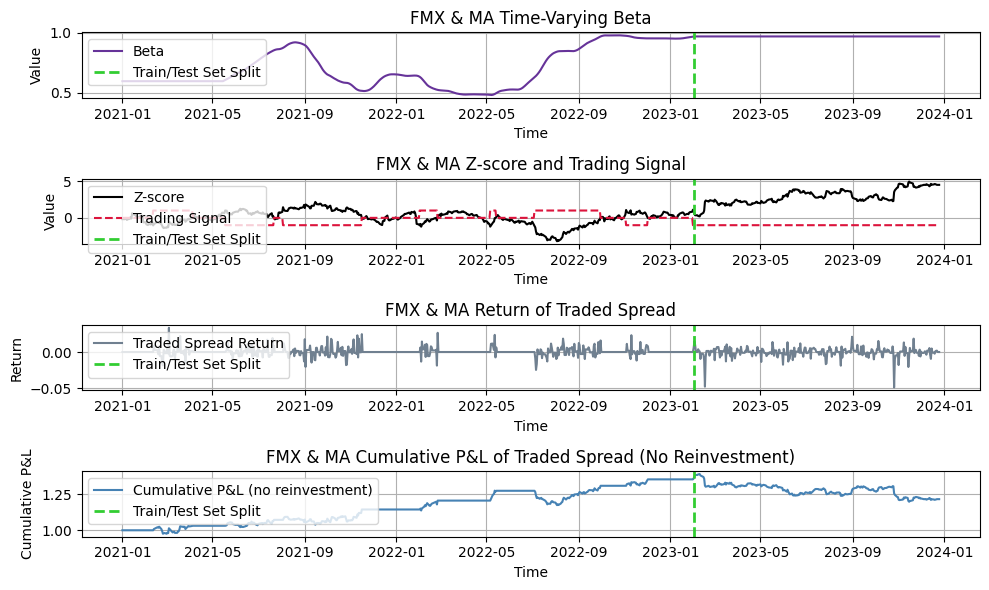

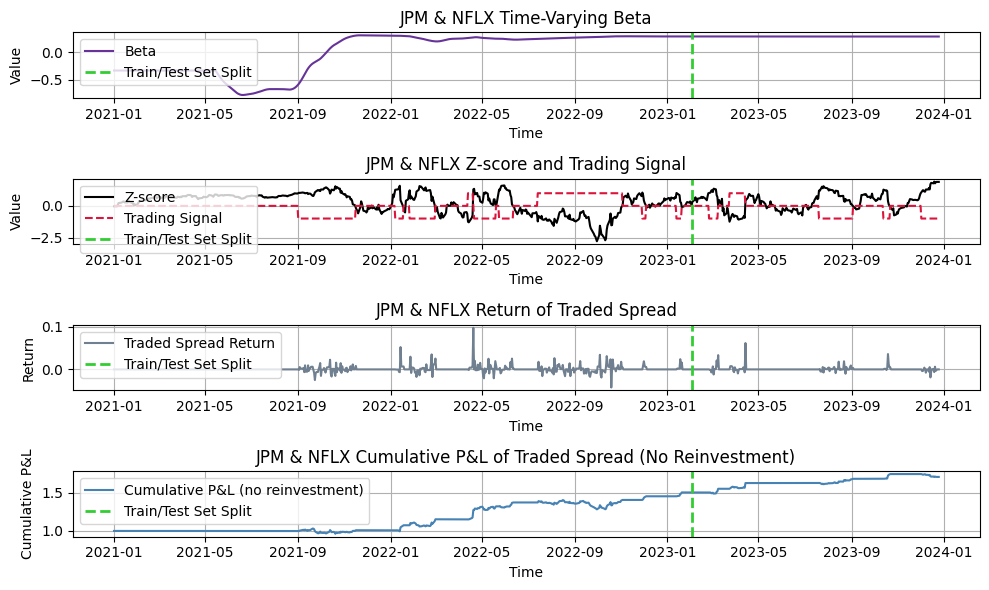

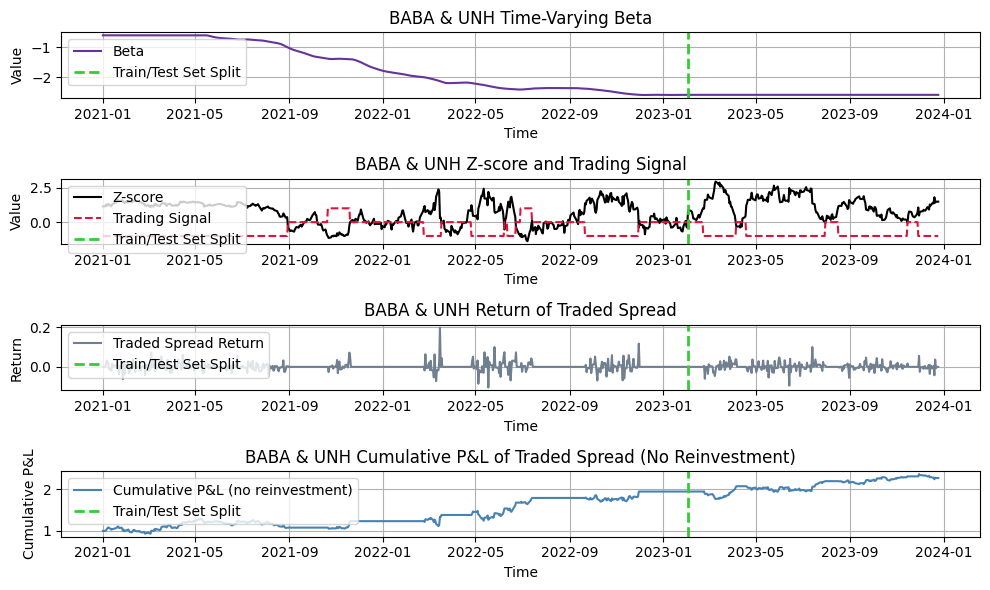

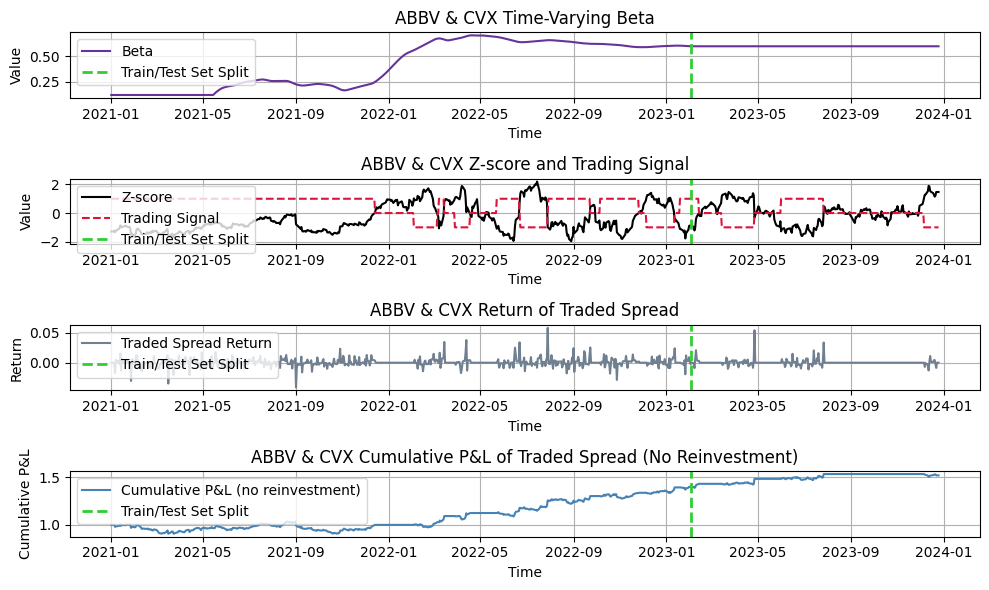

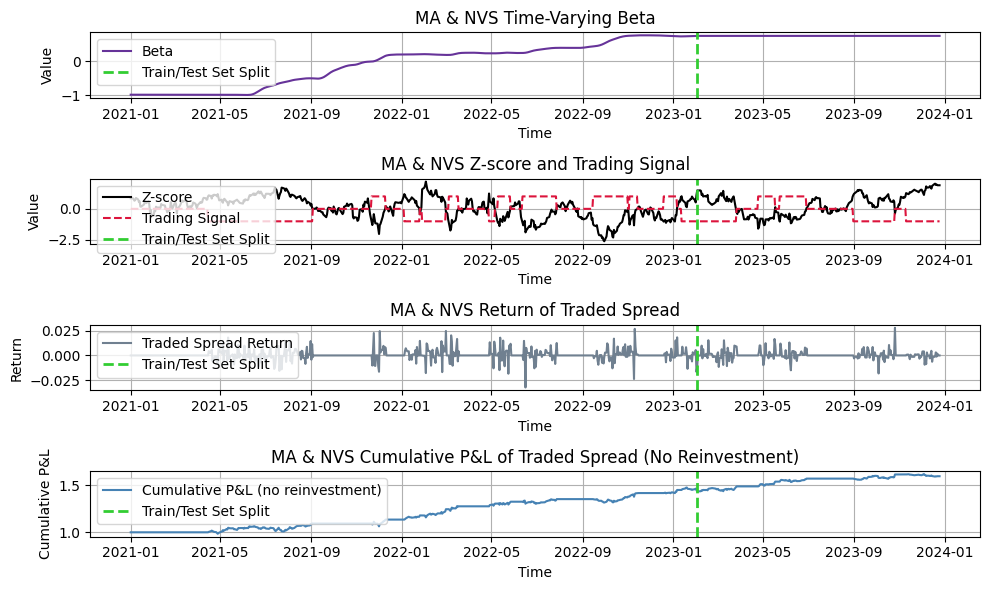

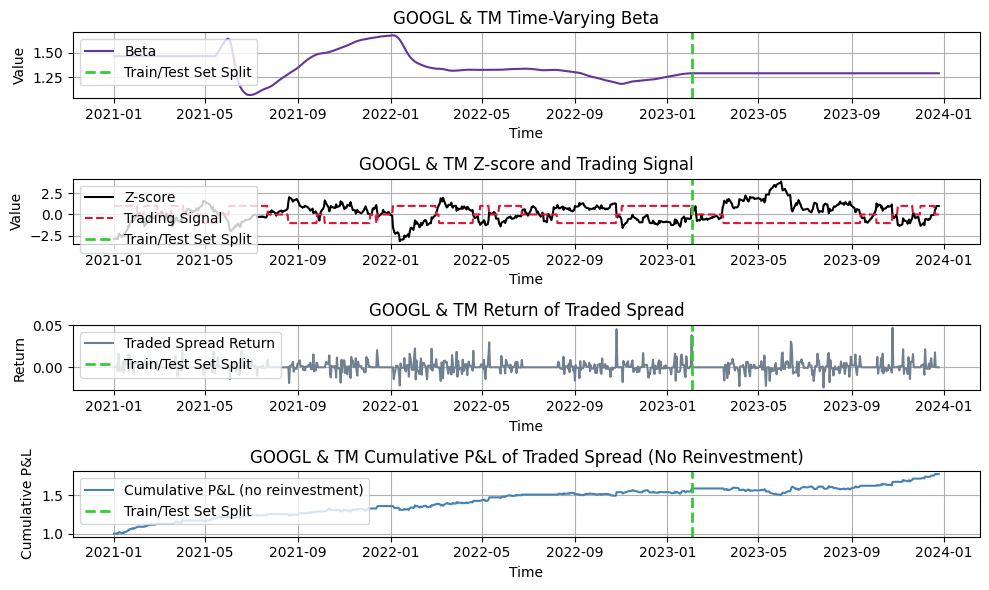

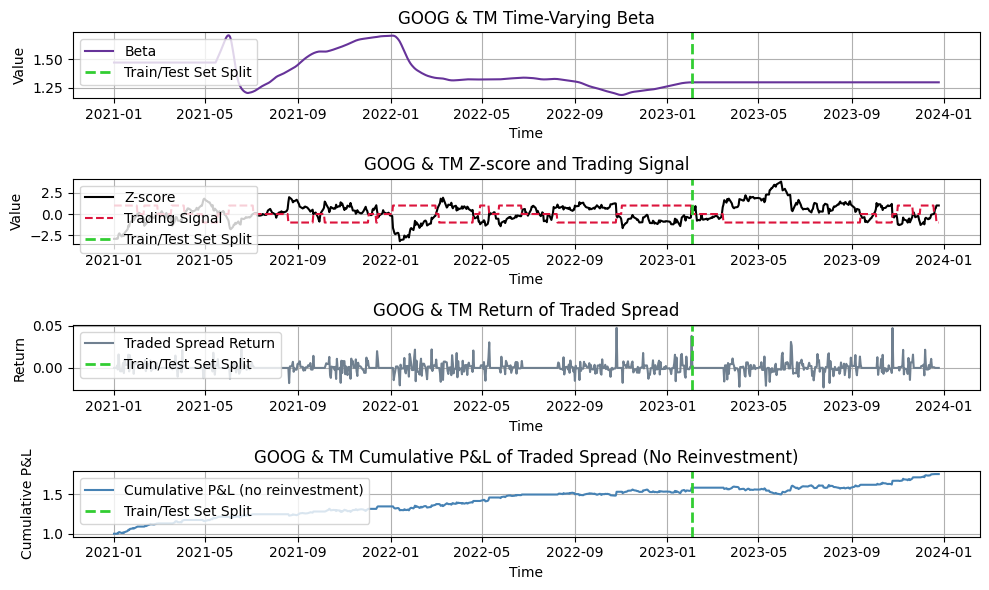

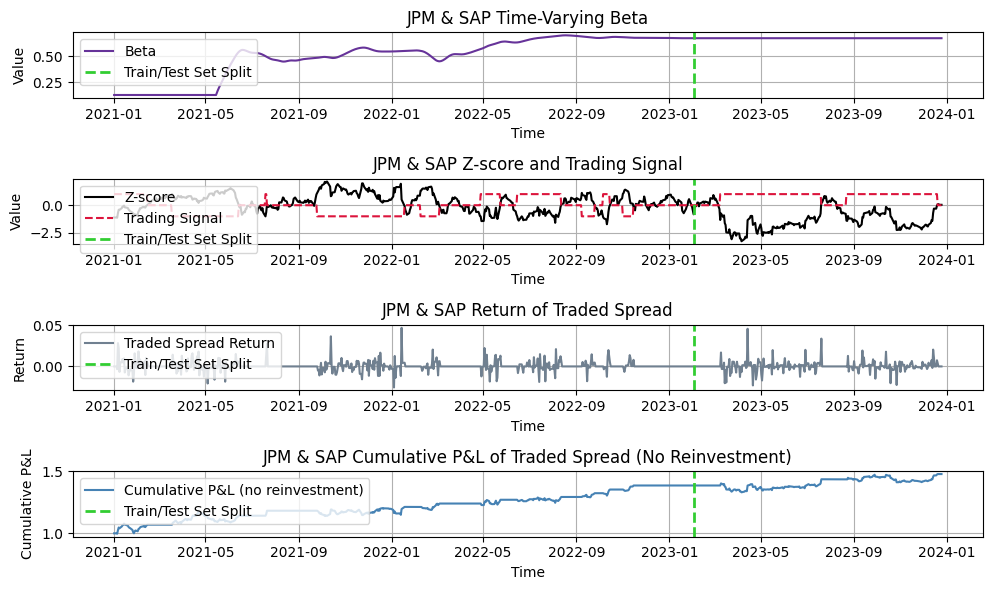

In [ ]:
def rolling_signals_zscore_evolution(asset1, asset2, ticker1_ts, ticker2_ts, z_threshold, beta):
    T_lookback = 125
    train = int(len(ticker1_ts) * 0.7)

    Z_score = []
    for i in range(0,len(beta)):
      spread = (1/(1+beta[i]))*np.log(ticker1_ts) - ((beta[i]/(1+beta[i]))*np.log(ticker2_ts))
      spread_mean = spread.iloc[0:train].mean(skipna=True)
      spread_var = float(spread.iloc[0:train].var(skipna=True))
      Z = (spread[i] - spread_mean) / np.sqrt(spread_var)
      Z_score.append(Z)

    Z_score = pd.DataFrame({'Z_score':Z_score})
    Z_score.index = ticker1_ts.index

    threshold_long = threshold_short = Z_score.copy()
    threshold_short = z_threshold
    threshold_long = -z_threshold

    signal = Z_score.copy()
    signal = pd.DataFrame(signal, columns=["signal"])
    signal[:] = np.nan

    long_freq, short_freq = 0,0
    # initial position
    signal.iloc[0] = 0
    if (Z_score.iloc[0] <= threshold_long).all():
        signal.iloc[0] = 1
        long_freq += 1
    elif (Z_score.iloc[0] >= threshold_short).all():
        signal.iloc[0] = -1
        short_freq += 1

    # loop
    for t in range(1, len(Z_score)):
        if (signal.iloc[t-1] == 0).any():  # if we were in no position
            if (Z_score.iloc[t] <= threshold_long).all():
                signal.iloc[t] = 1
                long_freq += 1
            elif (Z_score.iloc[t] >= threshold_short).all():
                signal.iloc[t] = -1
                short_freq += 1
            else:
                signal.iloc[t] = 0
        elif (signal.iloc[t-1] == 1).all():  # if we were in a long position
            if (Z_score.iloc[t] >= 0).all():
                signal.iloc[t] = 0
            else:
                signal.iloc[t] = signal.iloc[t-1]
        else:  # if we were in a short position
            if (Z_score.iloc[t] <= 0).all():
                signal.iloc[t] = 0
            else:
                signal.iloc[t] = signal.iloc[t-1]

    spread_return = np.squeeze(np.array(spread.diff()))
    lagged_signal = np.squeeze(np.array(signal.shift(1))) # NOTE THE SHIFT!
    traded_return = spread_return*lagged_signal
    traded_return = np.nan_to_num(traded_return, nan=0)
    traded_return = {"traded spread":traded_return}
    traded_return = pd.DataFrame(traded_return)
    traded_return.index = spread.index

    plt.figure(figsize=(10, 6))
    plt.subplot(4, 1, 1)
    plt.plot(ticker1_ts.index, beta,label="Beta", color='rebeccapurple')
    plt.grid()
    train_end_time = ticker1_ts.index[train]
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(asset1 +" & " + asset2 + ' Time-Varying Beta')
    plt.legend(loc='upper left')

    plt.subplot(4, 1, 2)
    plt.plot(Z_score, label="Z-score", color="black")
    plt.plot(signal, label="Trading Signal", linestyle="--", color="crimson")
    plt.grid()
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(asset1 +" & " + asset2 + ' Z-score and Trading Signal')
    plt.legend(loc='upper left')

    # Plot Return of Traded Spread
    plt.subplot(4, 1, 3)
    plt.plot(traded_return.index, traded_return["traded spread"], label="Traded Spread Return", color="slategray")
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time')
    plt.ylabel('Return')
    plt.title(asset1 +" & " + asset2 +' Return of Traded Spread')
    plt.legend(loc='upper left')
    plt.grid()

    # Plot Cumulative P&L of Traded Spread (No Reinvestment)
    plt.subplot(4, 1, 4)
    cum_pnl = 1 + traded_return.cumsum()
    plt.plot(cum_pnl.index, cum_pnl["traded spread"], label="Cumulative P&L (no reinvestment)", color="steelblue")
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time')
    plt.ylabel('Cumulative P&L')
    plt.title(asset1 +" & " + asset2 + ' Cumulative P&L of Traded Spread (No Reinvestment)')
    plt.legend(loc='upper left')
    plt.grid()

    plt.tight_layout()
    plt.show()

    return cum_pnl, [long_freq, short_freq]

def Rolling_OLS_Pair_original(ticker1_ts, ticker2_ts, asset1, asset2, z_threshold):

    T_lookback = 125
    train = int(len(ticker1_ts) * 0.7)
    test = len(ticker1_ts) - train
    mu_rolling_LS, beta_rolling_LS = [], []

    for t in range(0,train):
      if t < T_lookback:
        pass
      elif (t >= T_lookback) and (t < train) :
        y1 = np.log(ticker1_ts.iloc[:t])
        y2 = sm.add_constant(np.log(ticker2_ts.iloc[:t]))
        model = sm.OLS(y1,y2)
        results = model.fit()
        mu_rolling_LS.append(results.params[0])
        beta_rolling_LS.append(results.params[1])
      else:
        break

    mu_rolling_LS  = list(np.convolve(mu_rolling_LS, np.ones(10)/10, mode='valid'))
    beta_rolling_LS = list(np.convolve(beta_rolling_LS, np.ones(10)/10, mode='valid'))

    mu_rolling_LS  = [mu_rolling_LS[0]] * (T_lookback+9) + mu_rolling_LS + [mu_rolling_LS[-1]] * (test)
    beta_rolling_LS = [beta_rolling_LS[0]] * (T_lookback+9) + beta_rolling_LS + [beta_rolling_LS[-1]] * (test)

    mu_rolling_LS,beta_rolling_LS = np.array(mu_rolling_LS), np.array(beta_rolling_LS)

    rolling_ols_pair = rolling_signals_zscore_evolution(asset1, asset2, ticker1_ts, ticker2_ts, z_threshold, beta_rolling_LS)

    return rolling_ols_pair

ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

rolling_ols_original_dict = {}
for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  tick1, tick2 = sanitized[ticker1],sanitized[ticker2]
  rolling_ols_pair = Rolling_OLS_Pair_original(tick1, tick2, ticker1, ticker2, 1)
  pair_name = ticker1+' & '+ticker2
  rolling_ols_original_dict[pair_name] = rolling_ols_pair
  print()


(ii) Set the threshold = 1 and rolling frequently:

The rolling window method involves a fixed window of 125 data points (approximately half a year of daily trading data). With each additional day, the earliest data point is removed, and the new day's data is added. In other words, each regression is conducted using only the most recent 125 data points.

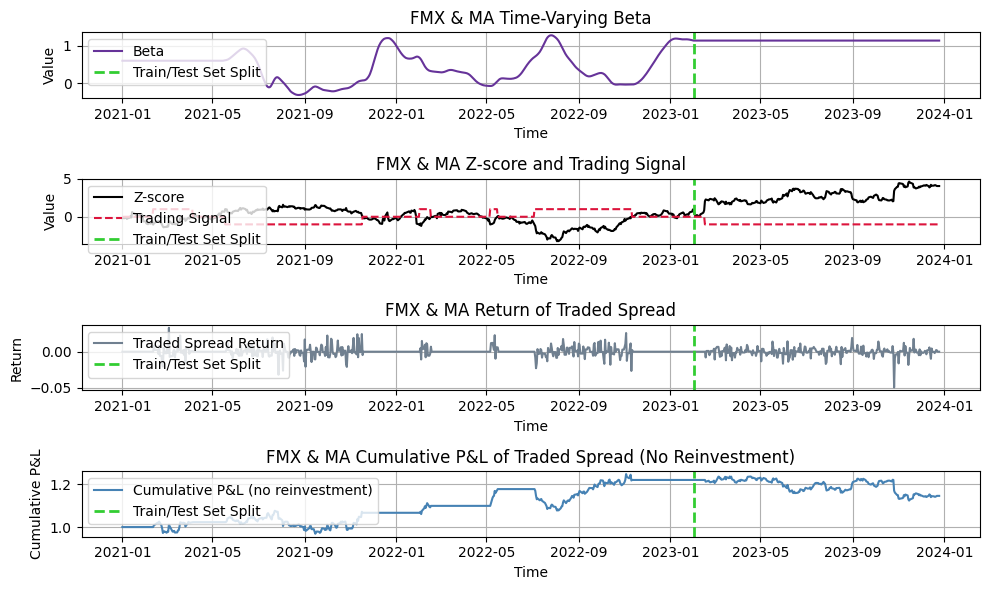

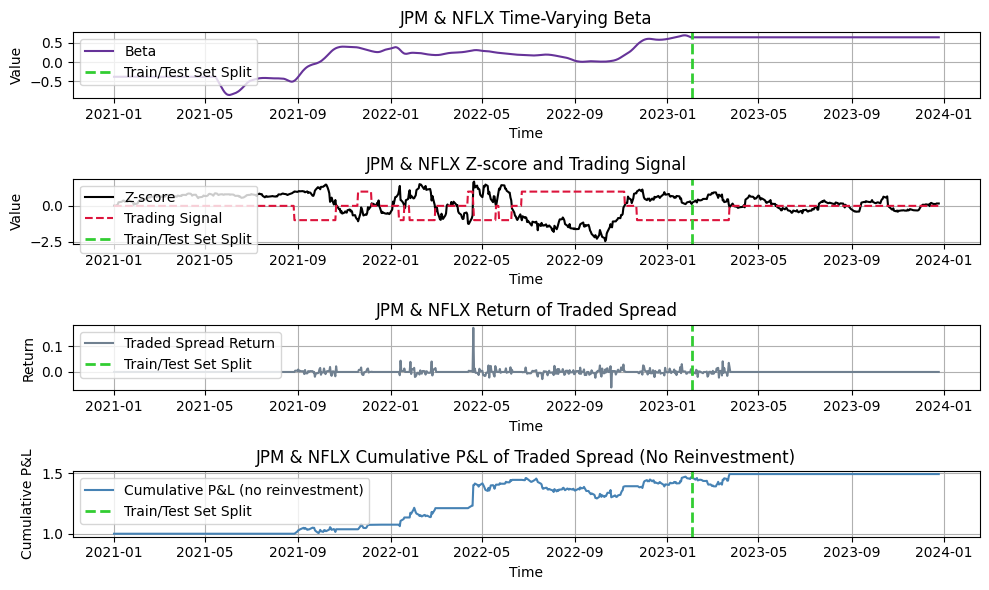

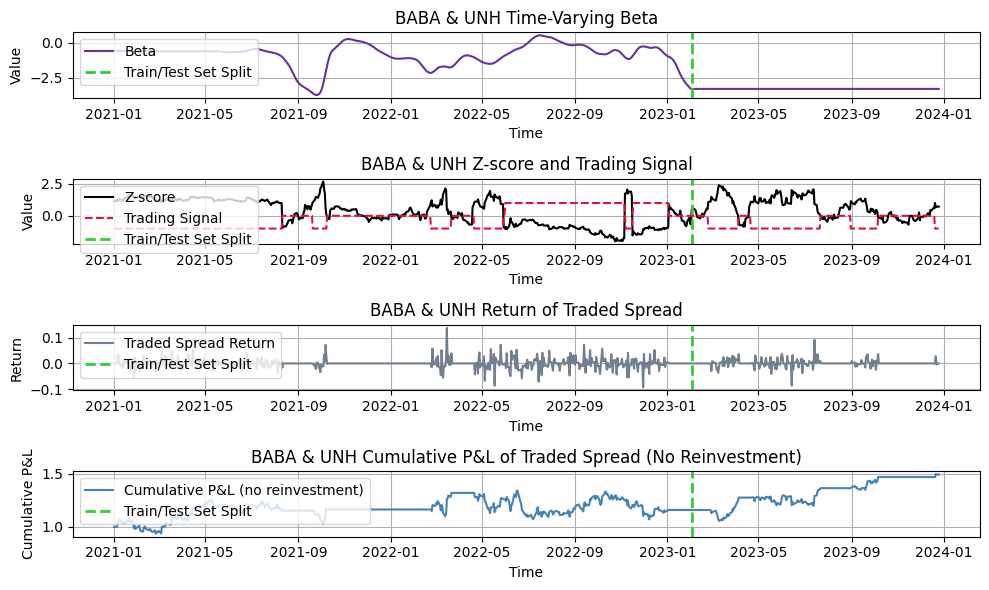

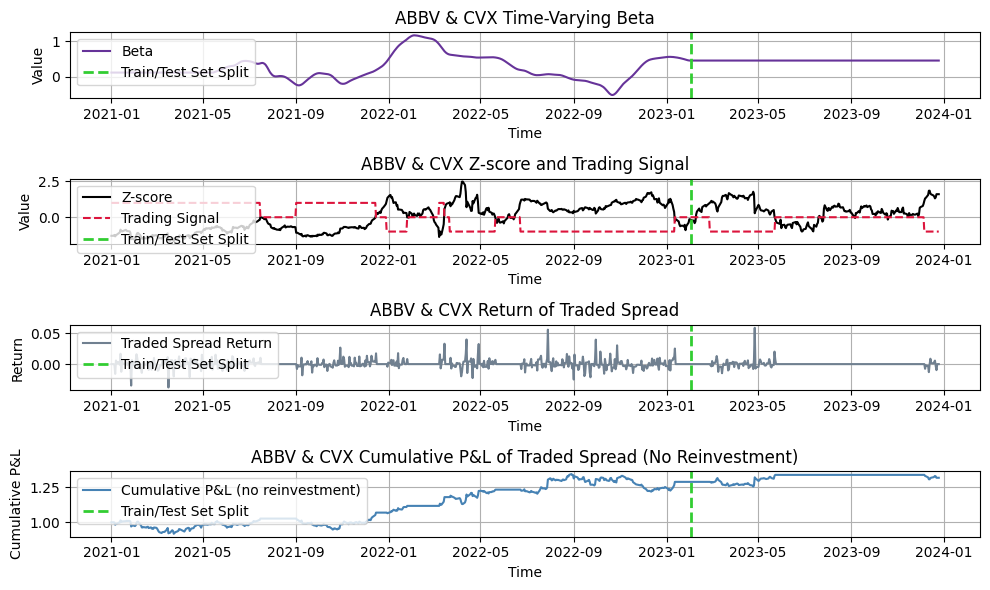

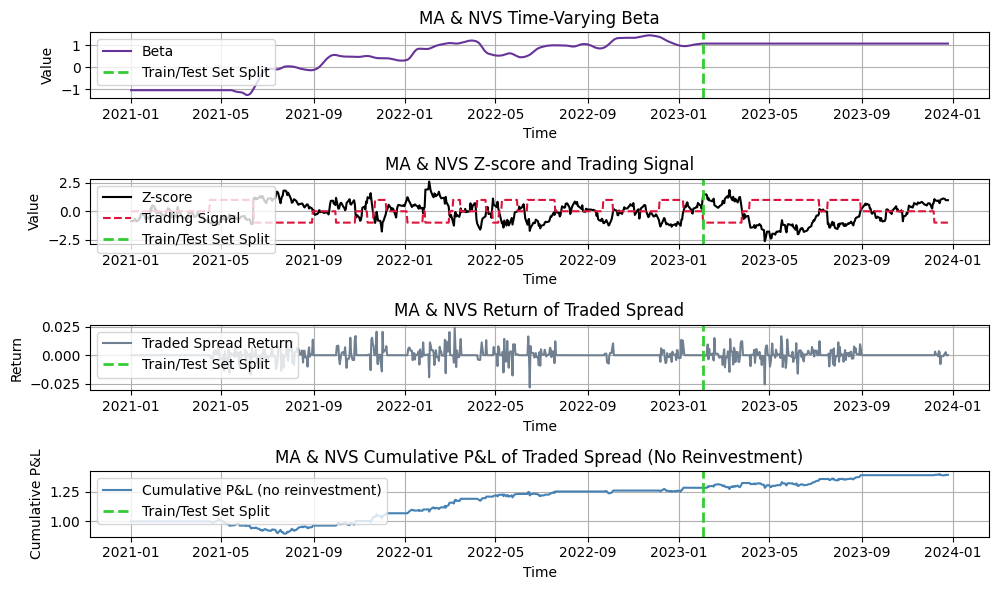

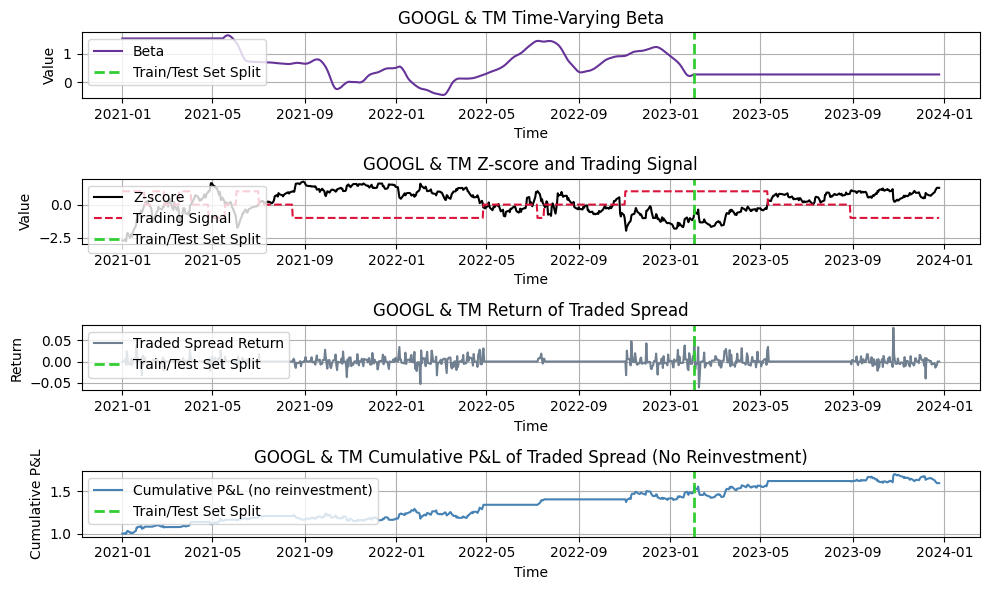

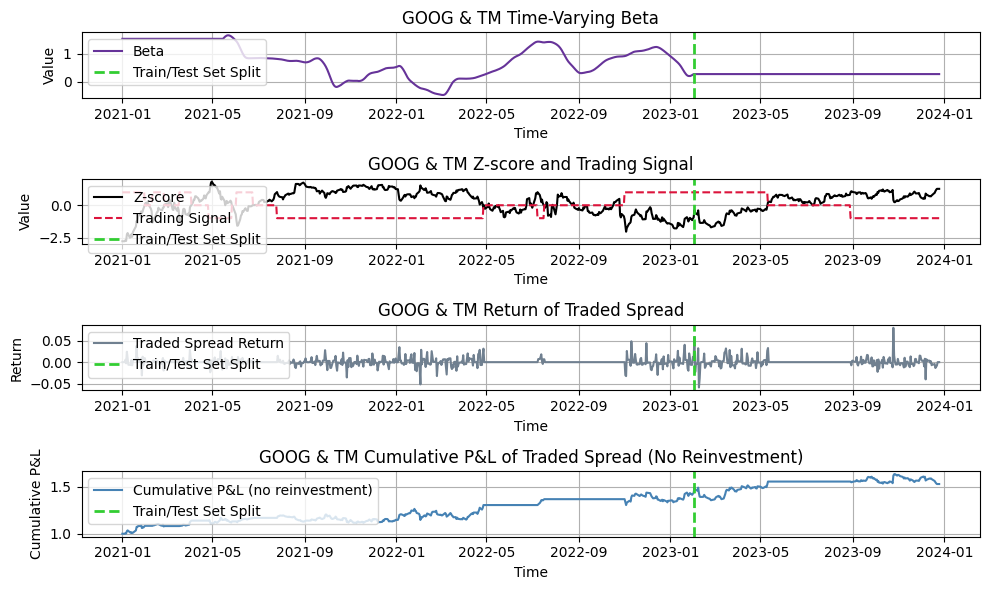

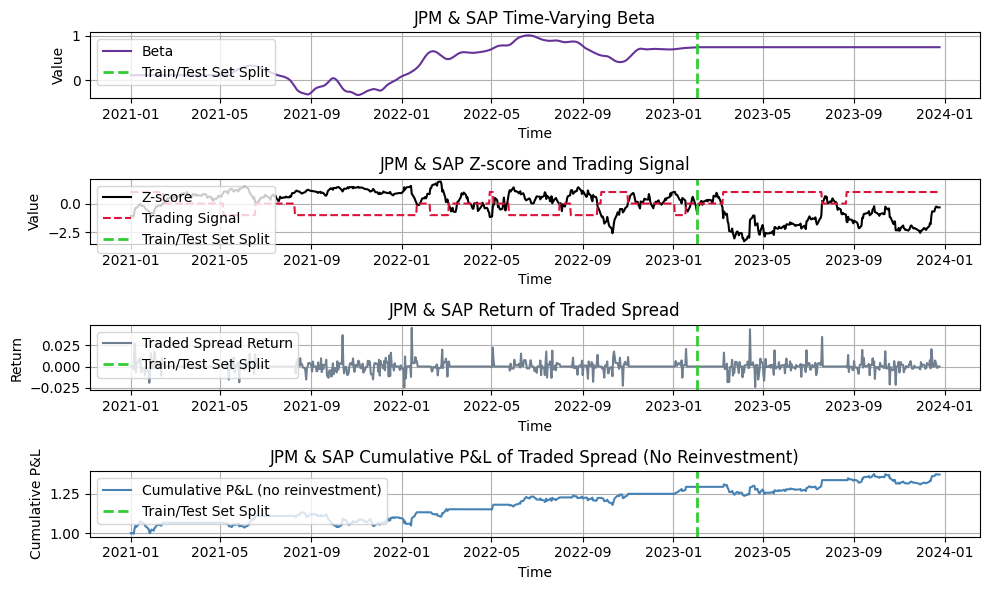

In [ ]:
def Rolling_OLS_Pair_revised(ticker1_ts, ticker2_ts, asset1, asset2, z_threshold):
    T_lookback = 125
    train = int(len(ticker1_ts) * 0.7)
    test = len(ticker1_ts) - train
    mu_rolling_LS, beta_rolling_LS = [], []

    for t in range(0,train):
      if t < T_lookback:
        pass
      elif (t >= T_lookback) and (t < train) :
        y1 = np.log(ticker1_ts.iloc[t-T_lookback:t])
        y2 = sm.add_constant(np.log(ticker2_ts.iloc[t-T_lookback:t]))
        model = sm.OLS(y1,y2)
        results = model.fit()
        mu_rolling_LS.append(results.params[0])
        beta_rolling_LS.append(results.params[1])
      else:
        break

    mu_rolling_LS  = list(np.convolve(mu_rolling_LS, np.ones(10)/10, mode='valid'))
    beta_rolling_LS = list(np.convolve(beta_rolling_LS, np.ones(10)/10, mode='valid'))

    mu_rolling_LS  = [mu_rolling_LS[0]] * (T_lookback+9) + mu_rolling_LS + [mu_rolling_LS[-1]] * (test)
    beta_rolling_LS = [beta_rolling_LS[0]] * (T_lookback+9) + beta_rolling_LS + [beta_rolling_LS[-1]] * (test)

    mu_rolling_LS,beta_rolling_LS = np.array(mu_rolling_LS), np.array(beta_rolling_LS)

    rolling_ols_pair = rolling_signals_zscore_evolution(asset1, asset2, ticker1_ts, ticker2_ts, z_threshold, beta_rolling_LS)

    return rolling_ols_pair


ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

rolling_ols_revised_dict = {}
for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  tick1, tick2 = sanitized[ticker1],sanitized[ticker2]
  rolling_ols_pair = Rolling_OLS_Pair_revised(tick1, tick2, ticker1, ticker2, 1)
  pair_name = ticker1+' & '+ticker2
  rolling_ols_revised_dict[pair_name] = rolling_ols_pair
  print()


Let's see the difference between their in-sample and out-of-sample performance.

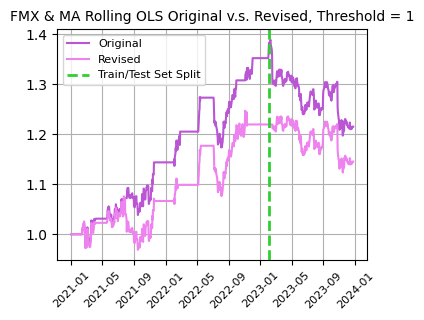

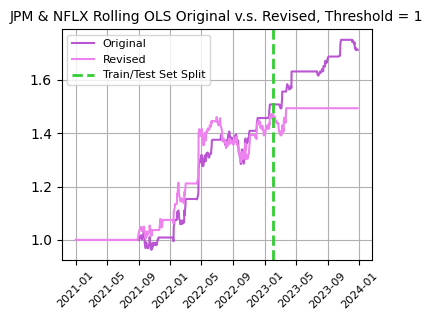

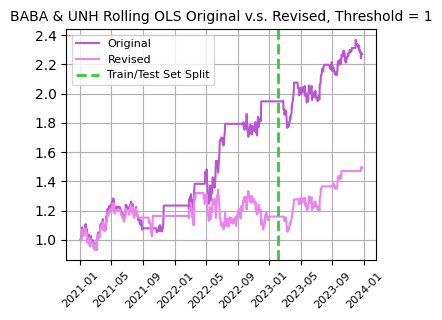

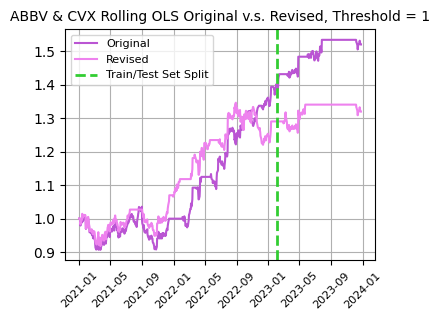

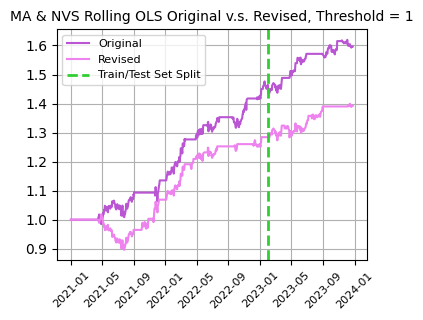

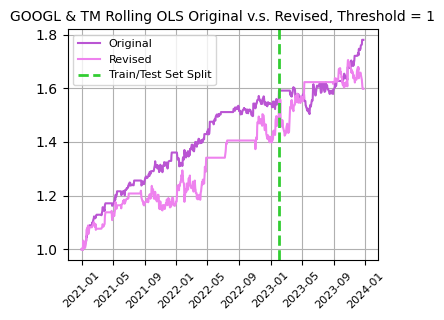

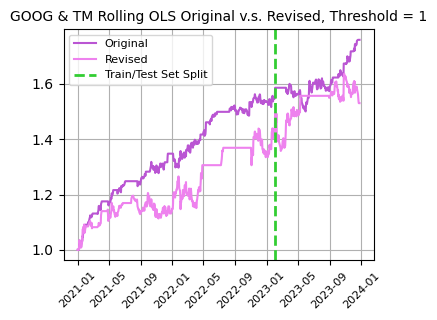

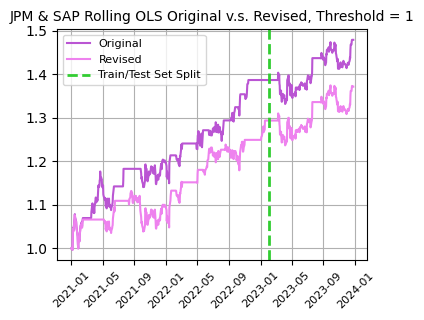

In [ ]:
def OTS_Comparison(dict01, dict02, threshold):
  # Print Complete Comparison Results

  ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]
  dict_long, dict_short = {}, {}
  for i, (ticker1, ticker2) in enumerate(ticker_pairs):
     pair_name = ticker1+' & '+ticker2
     pl01 = dict01[pair_name][0]
     pl02 = dict02[pair_name][0]

     f = plt.figure(figsize=(4, 3))
     plt.title(pair_name + ' Rolling OLS Original v.s. Revised, Threshold = ' + str(threshold) ,fontsize=10)
     plt.plot(pl01, label='Original',color = 'mediumorchid')
     plt.plot(pl02, label='Revised', color = 'violet')
     plt.xticks(rotation=45,fontsize=8)

     ticker_ts = sanitized["FMX"]
     train = int(len(ticker_ts) * 0.7)
     train_end_time = ticker_ts.index[train]
     plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')

     plt.legend(fontsize=8,loc='upper left')  # Add legend to display labels
     plt.grid()
     plt.show()
     print()
  return

# (long_freq, short_freq)  The former is the long_freq, and the latter is the short_freq
comparison = OTS_Comparison(rolling_ols_original_dict,rolling_ols_revised_dict, 1)


**Conclusion**

Recall that the original rolling approach requires a minimum of 125 data points (approximately half a year of daily trading data), with one additional data point added for each additional day while the revised one involves a fixed window of 125 data points. The former contains more information and may hence perform better.

### **The Kalman Filter Approach**

There are other methods available for capturing time-varying parameters here, such as the Kalman filter. Its main concept involves the unobservable state variables and observable variables. Firstly, the state transition matrix is used to describe the relationship between the current and previous period state variables, along with the inclusion of error terms from random variables. Then, the observation coefficient matrix is employed to depict the relationship between concurrently observable variables and state variables, along with the addition of error terms from observable random variables. The Kalman filter is suitable for affine models, capable of simultaneously incorporating information from time series and cross-sectional data, thereby enhancing the performance in tracking time-varying parameters and trading strategy effectiveness.

Let $\mathbf{x_{t}}$ be the state variable, denoted by $\mathbf{x_{t}}$ $≜$ $[ \mu_{t} \ \beta_{t} ]^{T}$. Let $\mathbf{T}$ be the state transition matrix, which is a 2 $\times$ 2 identity matrix.
The state transition equation in the Kalman filter can be showed as follows:
$$ \mathbf{x_{t}} = \mathbf{T} \mathbf{x_{t-1}} + \eta_{t}, $$
where $\eta_{t}$ $\sim$ $\mathcal{N}(0,\mathbf{Q})$ is the i.i.d. state transition noise with

\begin{equation*}
\mathbf{Q} = \begin{bmatrix}
    \sigma_{1}^{2} & 0 \\
    0 & \sigma_{2}^{2} \\
\end{bmatrix}.
\end{equation*}

Recall that $y_{1t}$ is the (log-)price of an asset. Let $\mathbf{Z}_{t}$ be the observation coefficient matrix, denoted by $\mathbf{Z}_{t}$ $≜$ $[1 \ y_{2t} ]$.
The observation equation in the Kalman filter can be showed as follows:
$$ y_{1t} = \mathbf{Z}_{t} \mathbf{x}_{t} + ϵ_{t}, $$
where $ϵ_{t}$ $\sim$ $\mathcal{N}(0,\sigma_{ϵ}^{2})$ is the i.i.d. observation noise. The parameters $\sigma_{1}$, $\sigma_{2}$, and $\sigma_{ϵ}$ can be estimated with the historical data.


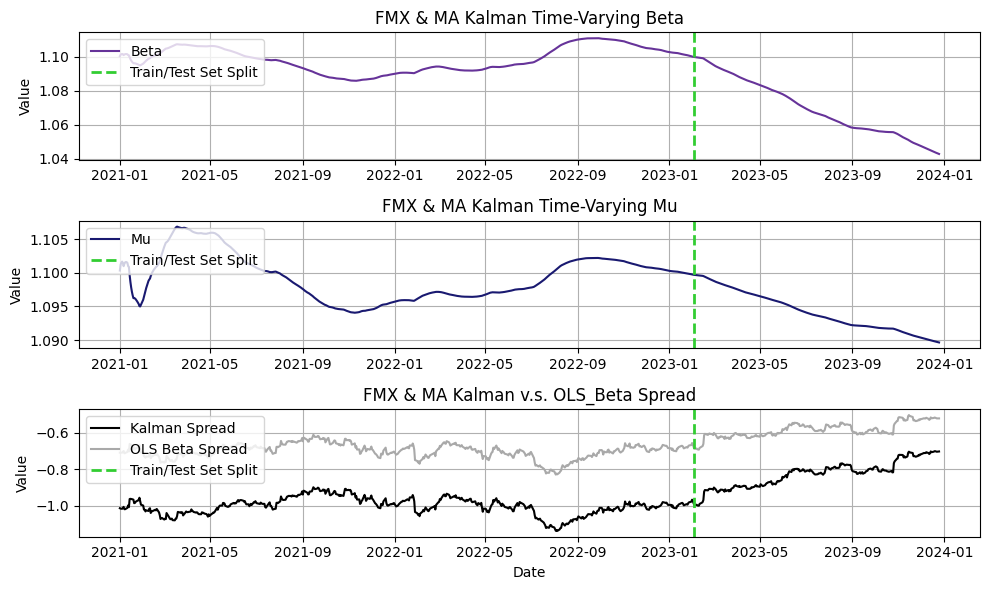

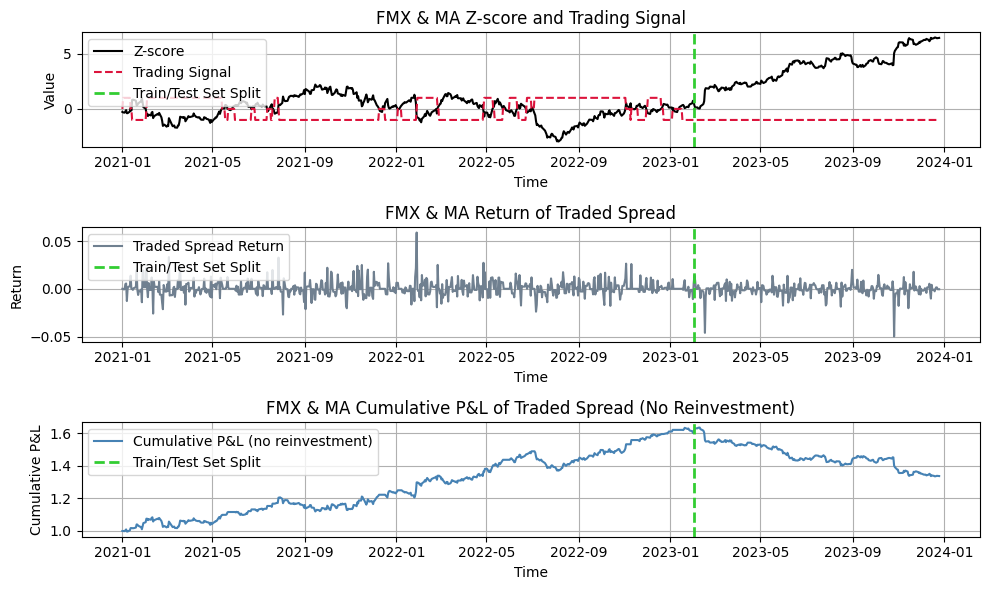

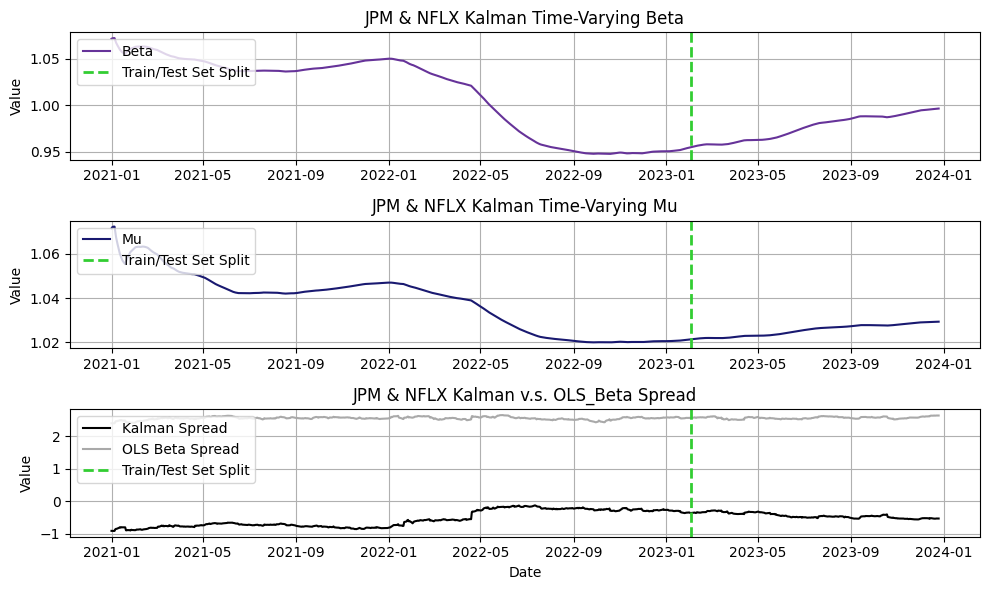

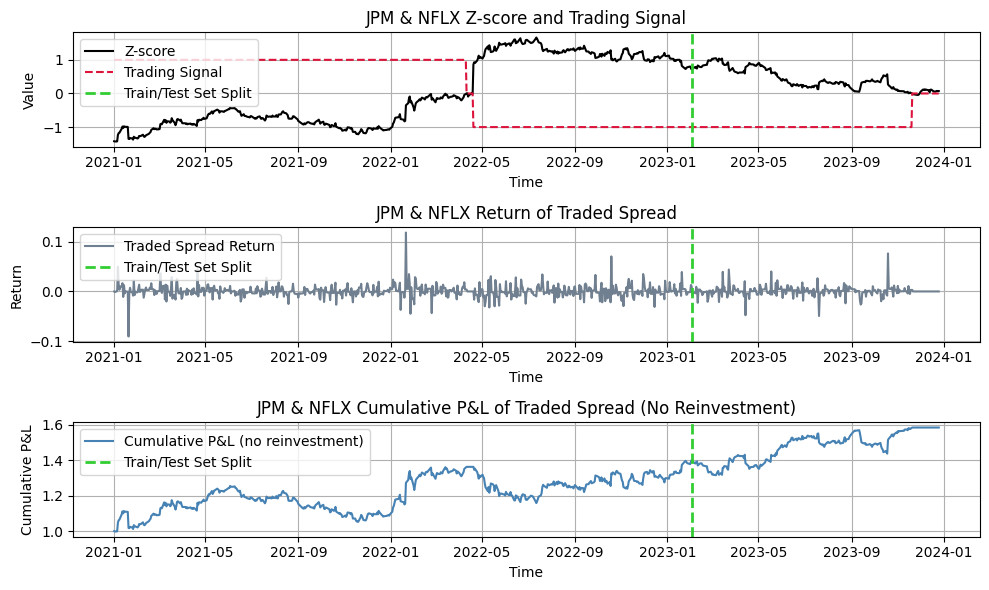

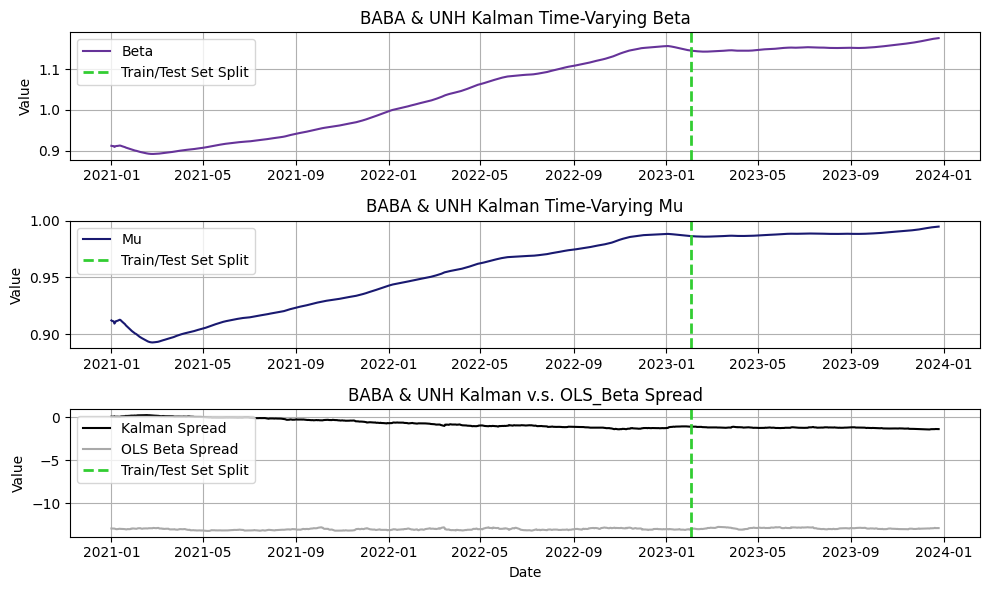

...

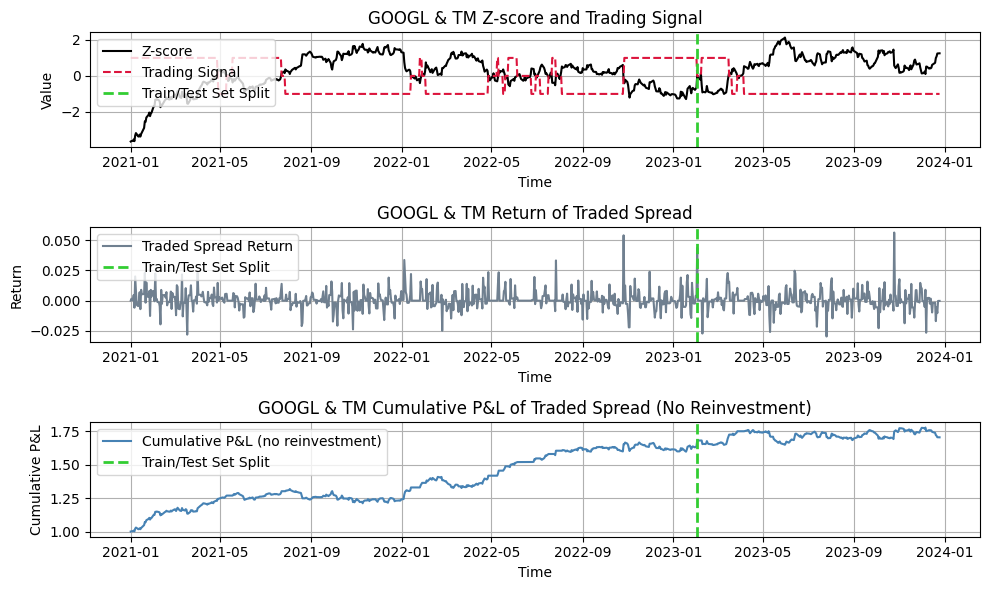

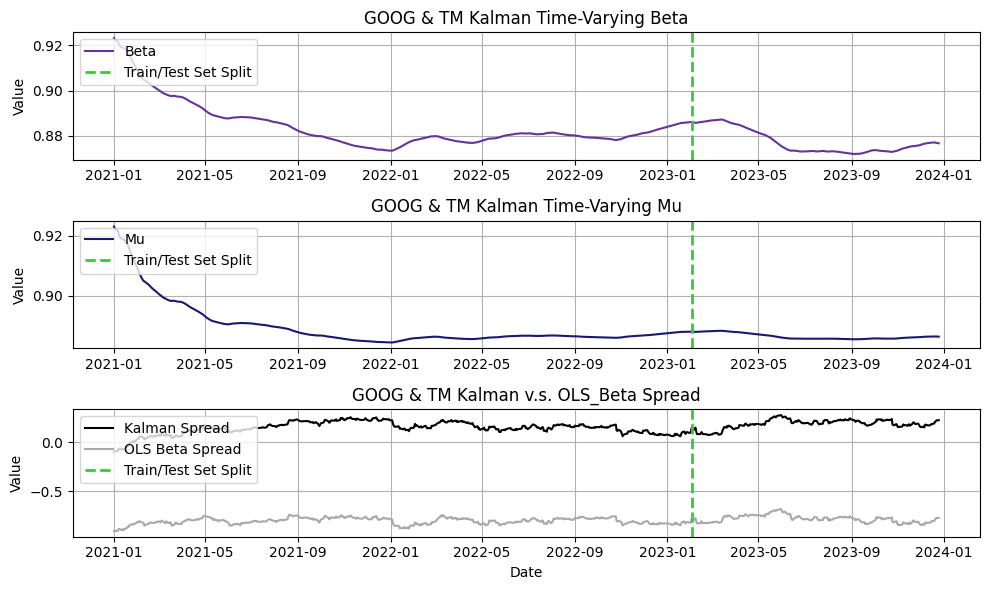

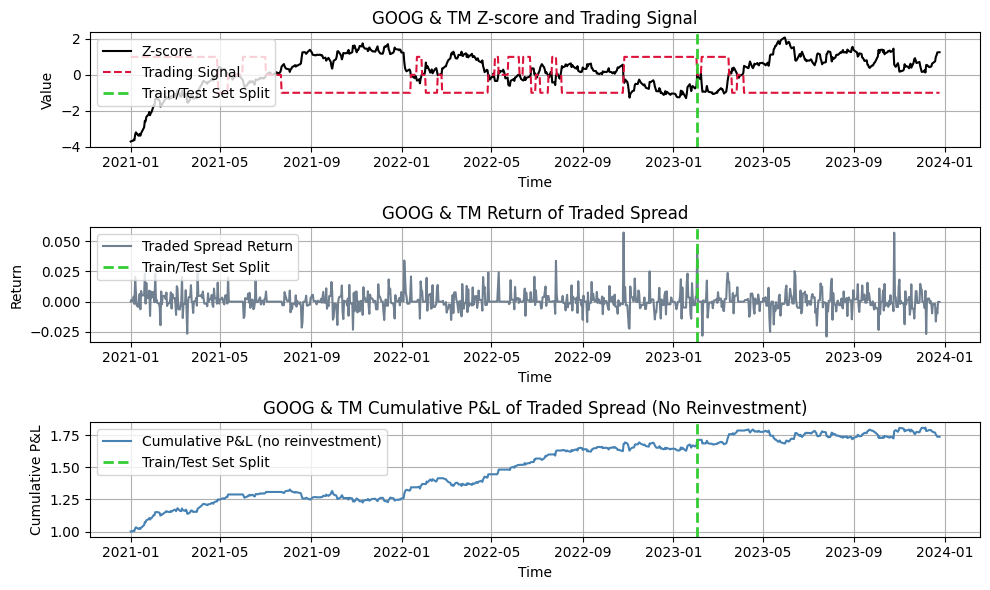

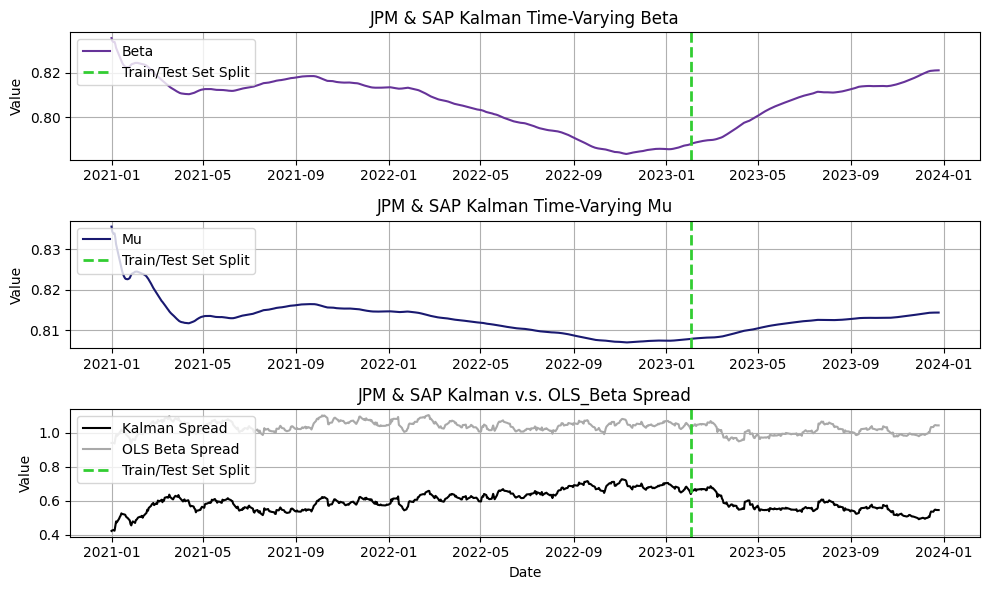

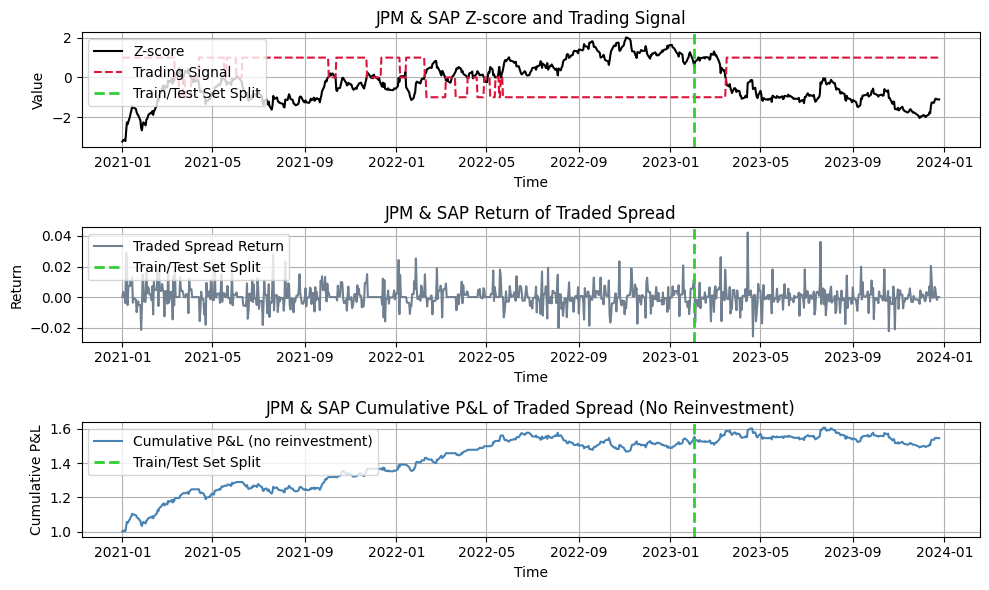

In [ ]:
def signals_zscore_evolution_kalman(asset1, asset2, ticker1_ts, ticker2_ts, spread, z_threshold):
    train = int(len(ticker1_ts) * 0.7)

    spread_mean = spread.iloc[0:train].mean(skipna=True)
    spread_var = float(spread.iloc[0:train].var(skipna=True))

    Z_score = (spread - spread_mean) / np.sqrt(spread_var)
    Z_score.columns = ["Z-score"]

    threshold_short = z_threshold
    threshold_long = -z_threshold

    signal = Z_score.copy()
    signal = pd.DataFrame(signal, columns=["signal"])
    signal[:] = np.nan

    long_freq, short_freq = 0,0
    # initial position
    signal.iloc[0] = 0
    if Z_score.iloc[0] <= threshold_long:
        signal.iloc[0] = 1
        long_freq += 1
    elif Z_score.iloc[0] >= threshold_short:
        signal.iloc[0] = -1
        short_freq += 1
    # loop
    for t in range(1, len(Z_score)):
        if (signal.iloc[t-1] == 0).all():  # if we were in no position
            if (Z_score.iloc[t] <= threshold_long).all():
                signal.iloc[t] = 1
                long_freq += 1
            elif (Z_score.iloc[t] >= threshold_short).all():
                signal.iloc[t] = -1
                short_freq += 1
            else:
                signal.iloc[t] = 0
        elif (signal.iloc[t-1] == 1).all():  # if we were in a long position
            if (Z_score.iloc[t] >= 0).all():
                signal.iloc[t] = 0
            else:
                signal.iloc[t] = signal.iloc[t-1]
        else:  # if we were in a short position
            if (Z_score.iloc[t] <= 0).all():
                signal.iloc[t] = 0
            else:
                signal.iloc[t] = signal.iloc[t-1]

    spread_return = np.squeeze(np.array(spread.diff()))
    lagged_signal = np.squeeze(np.array(signal.shift(1))) # NOTE THE SHIFT!
    traded_return = spread_return*lagged_signal
    traded_return = np.nan_to_num(traded_return, nan=0)
    traded_return = {"traded spread":traded_return}
    traded_return = pd.DataFrame(traded_return)
    traded_return.index = spread.index

    plt.figure(figsize=(10, 6))
    plt.subplot(3, 1, 1)
    plt.plot(Z_score, label="Z-score", color="black")
    plt.plot(signal, label="Trading Signal", linestyle="--", color="crimson")

    train_end_time = ticker1_ts.index[train]
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')

    plt.grid()
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title(asset1 +" & " + asset2 + ' Z-score and Trading Signal')
    plt.legend(loc='upper left')

    # Plot Return of Traded Spread
    plt.subplot(3, 1, 2)
    plt.plot(traded_return.index, traded_return["traded spread"], label="Traded Spread Return", color="slategray")
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time')
    plt.ylabel('Return')
    plt.title(asset1 +" & " + asset2 +' Return of Traded Spread')
    plt.legend(loc='upper left')
    plt.grid()

    # Plot Cumulative P&L of Traded Spread (No Reinvestment)
    plt.subplot(3, 1, 3)
    cum_pnl = 1 + traded_return.cumsum()
    plt.plot(cum_pnl.index, cum_pnl["traded spread"], label="Cumulative P&L (no reinvestment)", color="steelblue")
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.xlabel('Time')
    plt.ylabel('Cumulative P&L')
    plt.title(asset1 +" & " + asset2 + ' Cumulative P&L of Traded Spread (No Reinvestment)')
    plt.legend(loc='upper left')
    plt.grid()

    plt.tight_layout()
    plt.show()

    return cum_pnl, [long_freq, short_freq]



def Kalman_Filter_Pair(ticker1_ts, ticker2_ts, asset1, asset2, z_threshold):
    train = int(len(ticker1_ts) * 0.7)

    obs_mat = sm.add_constant(np.log(ticker1_ts).values, prepend=False)[:, np.newaxis]
    trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)
    kf = KalmanFilter(n_dim_obs=1, n_dim_state=2,initial_state_mean=np.ones(2),initial_state_covariance=np.ones((2, 2)),transition_matrices=np.eye(2),observation_matrices=obs_mat,observation_covariance=0.5,transition_covariance=0.000001 * np.eye(2))
    state_means, state_covs = kf.filter(np.log(ticker2_ts).values)

    beta = state_means[:, 0]
    mu = state_means[:, 1]

    train = int(len(ticker1_ts) * 0.7)
    Y, X = np.log(ticker1_ts[:train]), np.log(ticker2_ts[:train])
    X = sm.add_constant(X)
    model = sm.OLS(Y,X)
    results = model.fit()
    mu_ols, beta_ols = results.params[0], results.params[1]
    ols_spread = (1/(1+beta_ols))*np.log(ticker1_ts) - ((beta_ols/(1+beta_ols))*np.log(ticker2_ts))

    plt.figure(figsize=(10, 6))
    plt.subplot(3, 1, 1)
    plt.title(asset1 +" & " + asset2 +' Kalman Time-Varying Beta')
    plt.plot(ticker2_ts.index, beta, label="Beta", color='rebeccapurple')
    train_end_time = ticker1_ts.index[train]
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.legend(loc='upper left')
    plt.grid()
    plt.ylabel('Value')

    plt.subplot(3, 1, 2)
    plt.title(asset1 +" & " + asset2 +' Kalman Time-Varying Mu')
    plt.plot(ticker2_ts.index, mu, label="Mu", color='midnightblue')
    train_end_time = ticker1_ts.index[train]
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.legend(loc='upper left')
    plt.grid()
    plt.ylabel('Value')

    plt.subplot(3, 1, 3)
    plt.title(asset1 +" & " + asset2 + ' Kalman v.s. OLS_Beta Spread')
    kl_spread = (1/(1+beta))*np.log(ticker1_ts) - ((beta/(1+beta))*np.log(ticker2_ts)) #- mu
    plt.plot(ticker2_ts.index, kl_spread, label="Kalman Spread", color='black')
    plt.plot(ticker2_ts.index, ols_spread, label="OLS Beta Spread", color='darkgrey')
    train_end_time = ticker1_ts.index[train]
    plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
    plt.legend(loc='upper left')
    plt.grid()
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.tight_layout()
    plt.show()
    print()
    kf_pair = signals_zscore_evolution_kalman(asset1, asset2, ticker1_ts, ticker2_ts, kl_spread, z_threshold)
    print()

    return kf_pair

ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]

kalman_filter_pair_dict = {}
for i, (ticker1, ticker2) in enumerate(ticker_pairs):
  tick1, tick2 = sanitized[ticker1],sanitized[ticker2]
  kalman_filter_pair = Kalman_Filter_Pair(tick1, tick2, ticker1, ticker2, 0.3)
  pair_name = ticker1+' & '+ticker2
  kalman_filter_pair_dict[pair_name] = kalman_filter_pair


Let's set the threshold to 1 and compare the performance of all the methods mentioned above.

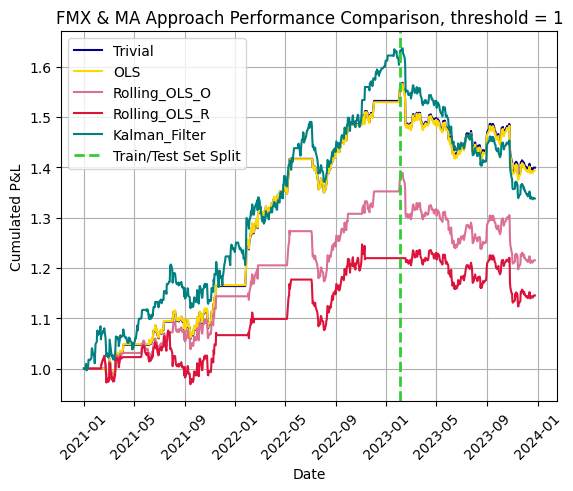

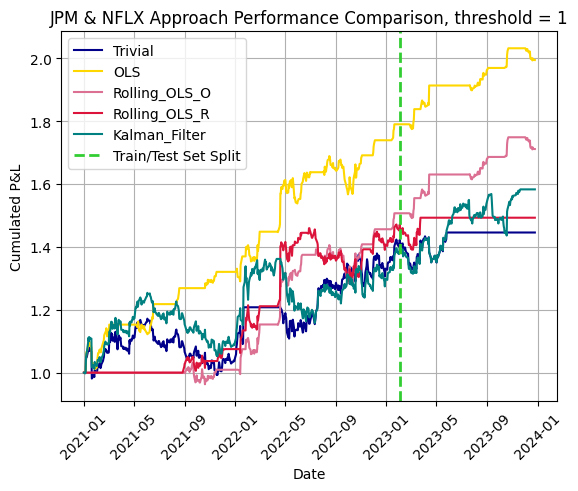

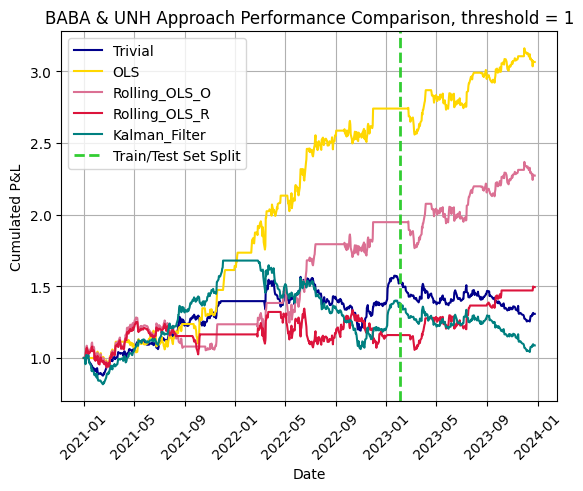

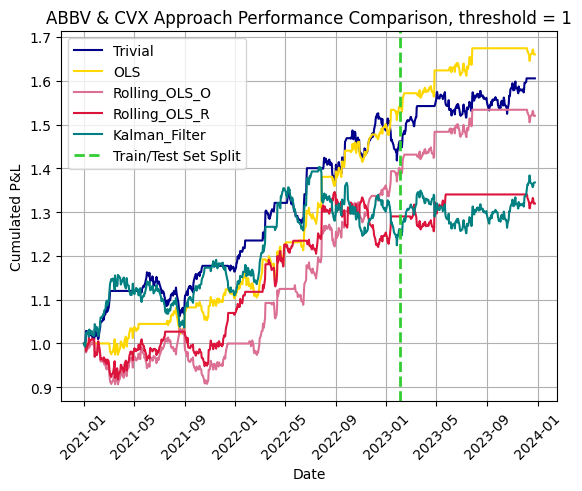

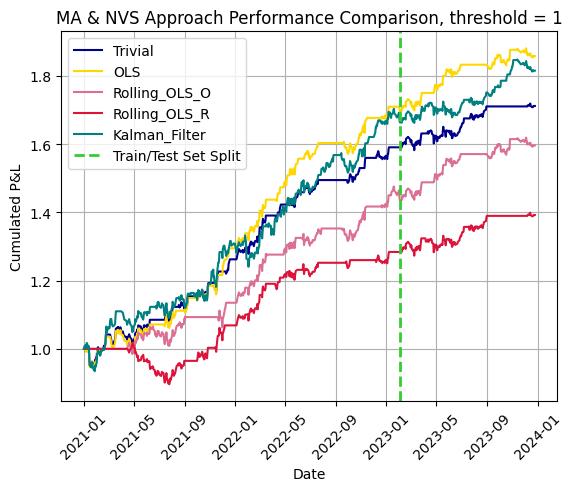

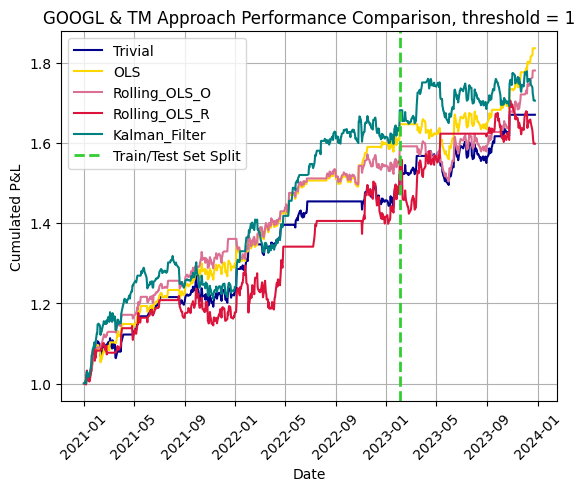

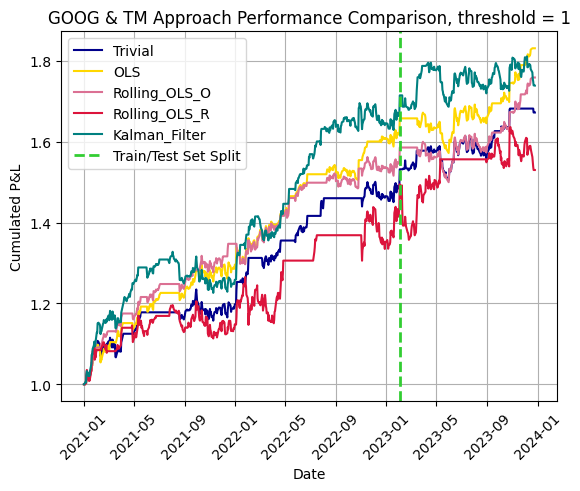

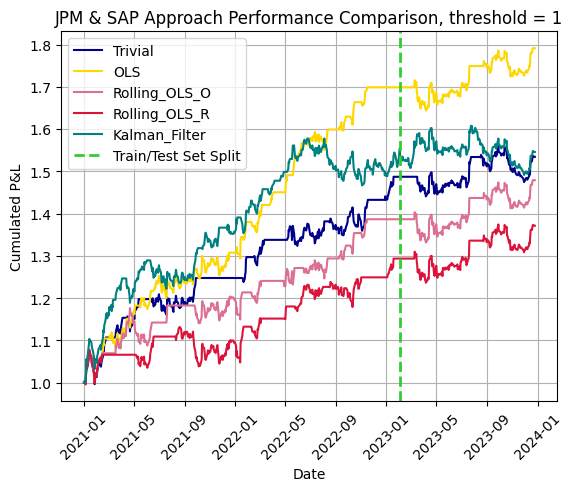

In [ ]:
def Total_Comparison():
   ticker_pairs = [("FMX","MA"), ("JPM","NFLX"), ("BABA","UNH"), ("ABBV","CVX"), ("MA","NVS"), ("GOOGL","TM"), ("GOOG","TM"), ("JPM","SAP")]
   train = int(len(sanitized["FMX"]) * 0.7)
   train_end_time = sanitized["FMX"].index[train]
   for i, (ticker1, ticker2) in enumerate(ticker_pairs):
      f = plt.figure()
      pair_name = ticker1+' & '+ticker2
      plt.title(pair_name + ' Approach Performance Comparison, threshold = 1')
      plt.plot(trivial_threshold01_dict[pair_name][0], label="Trivial", color="darkblue")
      plt.plot(ols_threshold01_dict[pair_name][0], label="OLS", color="gold")
      plt.plot(rolling_ols_original_dict[pair_name][0], label= 'Rolling_OLS_O', color="palevioletred")
      plt.plot(rolling_ols_revised_dict[pair_name][0], label= 'Rolling_OLS_R', color="crimson")
      plt.plot(kalman_filter_pair_dict[pair_name][0], label="Kalman_Filter", color="teal")
      plt.axvline(train_end_time, color='limegreen', linestyle='--', linewidth=2, label='Train/Test Set Split')
      plt.xticks(rotation=45)
      plt.ylabel('Cumulated P&L')
      plt.xlabel('Date')
      plt.grid()
      plt.legend(loc='upper left')
      print()

total_comparison = Total_Comparison()


**Conclusion**

(i) The trend of the spread formed by the Kalman filter is mostly consistent with the spread obtained through OLS.

(ii) In the selected time period and pairs, in the out-of-sample, i.e., the test set, both OLS and Kalman filter perform well. However, there are occasions when the Kalman filter may perform poorly.

## **II. Statistical Arbitrage and Mean-Reverting Portfolio**

### 1. **Vector Error Correction Model (VECM)**

$\blacksquare$ Remark: Vector Autoregression model (VAR) model

$$ \mathbf{r}_{t} = \mathbf{\phi}_{0} + \sum_{i=1}^{p-1} \mathbf{\widetilde{\phi}}_{i} \mathbf{r}_{t-i} + \mathbf{w}_{t},  $$


Denote the log-prices of multiple stocks as $\mathbf{y}_{t}$ and the log-returns as  $\mathbf{r}_{t}$ = $\mathbf{y}_{t}$ - $\mathbf{y}_{t-1}$ = $\triangle$ $\mathbf{y}_{t}$ . Log-prices are nonstationary whereas the log-returns are weakly stationary. However, differencing the log-prices may destroy part of the structure. The Vector Error Correction Model tries to fix the issue by adding an error correction term as follows:

$$ \mathbf{r}_{t} = \triangle \mathbf{y}_{t} = \mathbf{\phi}_{0} +  \Pi \mathbf{y}_{t-1} + \sum_{i=1}^{p-1} \mathbf{\widetilde{\phi}}_{i} \mathbf{r}_{t-i} + \mathbf{w}_{t},  $$

where $\phi_{0}$ as well as $\mathbf{\widetilde{\phi}}_{i}$ $\forall$ $i$ are coefficients. And $\Pi \mathbf{y}_{t-1}$ is the error correction term and it is stationary. If the above is true, then $\mathbf{y}_{t}$ is cointegrated.

There are 3 possibilities for $\Pi$:

(1) rank ($\Pi$) = 0 $\Rightarrow$  $\Pi$ = 0,  and thus $\mathbf{y}_{t}$ is not cointegrated.

(2) rank ($\Pi$) = N $\Rightarrow$ $\Pi$ is invertible and thus $\mathbf{y}_{t}$ must be stationary.


(3) 0 < rank ($\Pi$) < N $\Rightarrow$ $\Pi$ can be decomposed as $\Pi$ = $\mathbf{α}$$\mathbf{β}^{T}$ with $\mathbf{α}$, $\mathbf{β}$ ∈ $\mathbb{R}^{N × r}$ with full column rank.

$\quad$ $\Rightarrow$ $\mathbf{y}_{t}$ has r linearly independent cointegrated components. $\Rightarrow$ $\mathbf{β}^{T}$ $\mathbf{y}_{t}$,  each of which can be used for pairs trading.





###2. **Mean-Reverting Portfolio (MRP)**

Pairs trading focuses on finding cointegration between only two stocks. We can extend this statistical arbitrage from two stocks to more stocks to construct the "mean-reverting portfolio".

Consider the multiple log-prices $\mathbf{y}_{t}$ and use $\mathbf{β}$ to extract several spreads $\mathbf{s}_{t}$ = $\mathbf{β}^{T}$ $\mathbf{y}_{t}$.
And then we use  a portfolio weight matrix $\mathbf{w}$ to extract the best mean-reverting spread from st as
$\mathbf{z}_{t}$ = $\mathbf{w}^{T}$$\mathbf{s}_{t}$, which is determined with two main objectives:

(1) Large variance (profit of each trade): $\mathbf{w}^{T}$ $\mathbf{M}_{0}$ $\mathbf{w}$, where $\mathbf{M}_{i}$ = $\mathbb{E}$[($\mathbf{s}_{t}$ -$\mathbb{E}$[$\mathbf{s}_{t}$]) ($\mathbf{s}_{t}$ -$\mathbb{E}$ [$\mathbf{s}_{t}$])$^{T}$].


(2) Strong mean reversion (number of trades): many proxies exist like the Portmanteau statistics or crossing statistics.

$\blacksquare$ Remark: Proxy for the mean reversion :

(1) Portmanteau statistics:

\begin{align}
\min_{\substack{\mathbf{w}}} & \quad \sum_{i=1}^{p} (\frac{\mathbf{w}^{T} \mathbf{M}_{i} \mathbf{w}}{\mathbf{w}^{T} \mathbf{M}_{0} \mathbf{w}})^{2} \\
&\text{subject to} \quad \mathbf{w}^{T} \mathbf{M}_{0} \mathbf{w} = v, \mathbf{w} \in \mathbf{W}
\end{align}

(2) Other proxies:
\begin{align}
\min_{\substack{\mathbf{w}}} & \quad \mathbf{w}^{T} \mathbf{H} \mathbf{w} + λ\sum_{i=1}^{p} (\mathbf{w}^{T} \mathbf{M}_{i} \mathbf{w})^2 \\
&\text{subject to} \quad \mathbf{w}^{T} \mathbf{M}_{0} \mathbf{w} = v, \mathbf{w} \in \mathbf{W}
\end{align}

## **Reference:**
1. https://palomar.home.ece.ust.hk/MAFS5310_lectures/slides_pairs_trading.pdf
2. https://palomar.home.ece.ust.hk/MAFS5310_lectures/Rsession_pairs_trading_with_R.html
3. https://medium.com/call-for-atlas/pairs-trading-strategy-every-stock-needs-a-friend-e50723a1dc94
4. https://medium.com/@ab.jannatpour/advanced-pairs-trading-kalman-filters-b171144ce6d5
5. https://github.com/QuantConnect/Research/blob/master/Analysis/02%20Kalman%20Filter%20Based%20Pairs%20Trading.ipynb